In [ ]:
#importing library

import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB,BernoulliNB,CategoricalNB
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import classification_report,f1_score,recall_score,precision_score,confusion_matrix,accuracy_score,roc_auc_score,roc_curve

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
pd.set_option('display.max_columns', None)
data=pd.read_excel("https://github.com/SaunakMitra/Project/raw/refs/heads/main/telecom_customer_churn.xlsx");data

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,9,NaN,Yes,42.39,No,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.60,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,9,NaN,Yes,10.69,Yes,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.00,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.90,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.00,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,NaN,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.90,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,9987-LUTYD,Female,20,No,0,La Mesa,91941,32.759327,-116.997260,0,13,Offer D,Yes,46.68,No,Yes,DSL,59.0,Yes,No,No,Yes,No,No,Yes,Yes,One Year,No,Credit Card,55.15,742.90,0.00,0,606.84,1349.74,Stayed,NaN,NaN
7039,9992-RRAMN,Male,40,Yes,0,Riverbank,95367,37.734971,-120.954271,1,22,Offer D,Yes,16.20,Yes,Yes,Fiber Optic,17.0,No,No,No,No,No,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,85.10,1873.70,0.00,0,356.40,2230.10,Churned,Dissatisfaction,Product dissatisfaction
7040,9992-UJOEL,Male,22,No,0,Elk,95432,39.108252,-123.645121,0,2,Offer E,Yes,18.62,No,Yes,DSL,51.0,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,50.30,92.75,0.00,0,37.24,129.99,Stayed,NaN,NaN
7041,9993-LHIEB,Male,21,Yes,0,Solana Beach,92075,33.001813,-117.263628,5,67,Offer A,Yes,2.12,No,Yes,Cable,58.0,Yes,No,Yes,Yes,No,Yes,Yes,Yes,Two Year,No,Credit Card,67.85,4627.65,0.00,0,142.04,4769.69,Stayed,NaN,NaN


In [ ]:
#Filling Missing Values

data["Avg Monthly Long Distance Charges"]=data["Avg Monthly Long Distance Charges"].fillna(0)
data["Multiple Lines"]=data["Multiple Lines"].fillna("No")
data["Internet Type"]=data["Internet Type"].fillna("No")
data["Avg Monthly GB Download"]=data["Avg Monthly GB Download"].fillna(0)
data["Online Security"]=data["Online Security"].fillna("No")
data["Online Backup"]=data["Online Backup"].fillna("No")
data["Device Protection Plan"]=data["Device Protection Plan"].fillna("No")
data["Premium Tech Support"]=data["Premium Tech Support"].fillna("No")
data["Streaming TV"]=data["Streaming TV"].fillna("No")
data["Streaming Movies"]=data["Streaming Movies"].fillna("No")
data["Streaming Music"]=data["Streaming Music"].fillna("No")
data["Unlimited Data"]=data["Unlimited Data"].fillna("No")
data["Offer"]=data["Offer"].fillna("No")

In [ ]:
bins= [18,34,50,66,82]
labels = ['Young Adult','Adult','Mid-Age Adult','Senior Citizen']
data['AgeGroup'] = pd.cut(data['Age'], bins=bins, labels=labels, right=False)
data["AgeGroup"].value_counts()

,count
AgeGroup,
Adult,2100
Mid-Age Adult,1971
Young Adult,1909
Senior Citizen,1063


<Axes: xlabel='Age', ylabel='Count'>

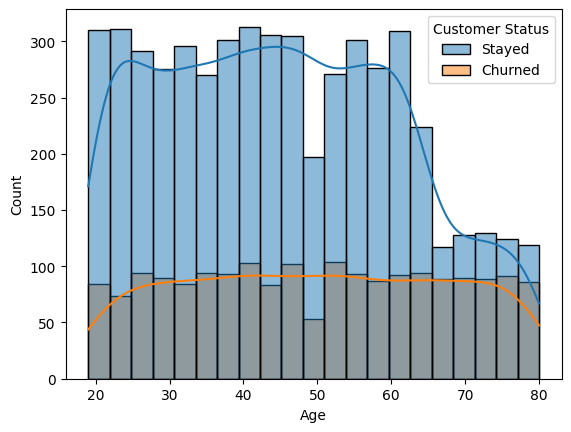

In [ ]:
import seaborn as sns
sns.histplot(data=data,x='Age',hue='Customer Status',kde=True)

Understanding the Plot:

The plot is a combination of a histogram and density plot, showing the distribution of customer statuses (likely 0 and 1) across different age groups. The x-axis represents the age range (20-80), and the y-axis represents the count of customers within each age group.

Key Insights:

Age Distribution: The overall distribution of customer ages appears to be right-skewed, meaning there are more younger customers compared to older ones. Customer Status by Age: Customer Status Churned: This group seems to have a relatively uniform distribution across most age ranges. Customer Status Stayed: This group shows a higher concentration in the younger age brackets (20-40) and then declines as age increases. Density Plot: The density plots provide a smoother representation of the distributions. For Customer Status Churned, the density plot is relatively flat, indicating a consistent distribution. For Customer Status Stayed, the density plot peaks in the younger age range and then tapers off, suggesting a higher concentration in the younger demographic. Possible Interpretations:

Younger Customers: The data suggests that younger customers are more likely to belong to Customer Status "Stayed". This could indicate a product or service that is more appealing to younger demographics. Age-Based Segmentation: The analysis might suggest that the customer base can be segmented based on age. Different marketing strategies or product offerings could be tailored to cater to the specific needs and preferences of different age groups. Customer Lifecycle: The decline in Customer Status "Stayed" for older age groups could be interpreted as a potential customer lifecycle pattern, where customers may transition to different statuses or churn as they age.

<Axes: xlabel='AgeGroup', ylabel='count'>

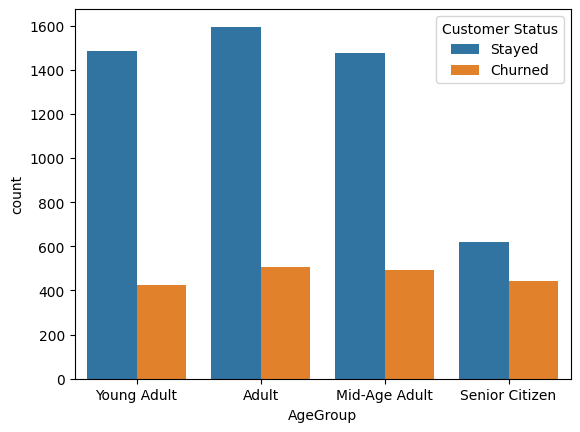

In [ ]:
sns.countplot(data=data,x='AgeGroup',hue='Customer Status')

Understanding the Chart:

The chart is a bar plot representing the distribution of customer statuses (likely 0 and 1) across different age groups: Young Adult, Adult, Mid-Age Adult, and Senior Citizen. The x-axis shows the age groups, and the y-axis represents the count of customers within each group.

Key Insights:

Customer Status Distribution: Customer Status 0: This group has a relatively consistent count across all age groups, with a slight increase in the Adult group. Customer Status 1: This group shows a higher count in the Adult group, decreasing significantly in the Senior Citizen group. Age Group Differences: Young Adult and Adult: These groups have a higher proportion of customers with Customer Status 0, suggesting a potential preference for the associated product or service among younger demographics. Senior Citizen: In these group, Customer Status 1 is more prevalent, indicating a different customer behavior or preference. Possible Interpretations:

Age-Based Segmentation: The data suggests that the customer base can be segmented based on age. Different marketing strategies or product offerings could be tailored to cater to the specific needs and preferences of each age group. Customer Lifecycle: The decline in Customer Status 0 for older age groups might indicate a potential customer lifecycle pattern, where customers may transition to different statuses or churn as they age. Product or Service Appeal: The higher proportion of Customer Status 0 in the younger age groups could suggest that the product or service is more appealing to younger demographics.

In [ ]:
df1=pd.pivot_table(data,index='AgeGroup',values="Age",columns="Customer Status",aggfunc='count');df1

<ipython-input-91-b45f14c39dc7>:1: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



Customer Status,Churned,Stayed
AgeGroup,,
Young Adult,426,1483
Adult,505,1595
Mid-Age Adult,493,1478
Senior Citizen,445,618


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Display basic information about the dataset
print(data.info())

# Show the first few rows of the dataset
print("\
First few rows of the dataset:")
print(data.head())

# Display summary statistics
print("\
Summary statistics:")
print(data.describe())

# Calculate churn rate
churn_rate = data[data['Customer Status'] == 'Churned'].shape[0] / data.shape[0] * 100
print(f"\
Churn Rate: {churn_rate:.2f}%")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 39 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   Customer ID                        7043 non-null   object  
 1   Gender                             7043 non-null   object  
 2   Age                                7043 non-null   int64   
 3   Married                            7043 non-null   object  
 4   Number of Dependents               7043 non-null   int64   
 5   City                               7043 non-null   object  
 6   Zip Code                           7043 non-null   int64   
 7   Latitude                           7043 non-null   float64 
 8   Longitude                          7043 non-null   float64 
 9   Number of Referrals                7043 non-null   int64   
 10  Tenure in Months                   7043 non-null   int64   
 11  Offer                              7043 non

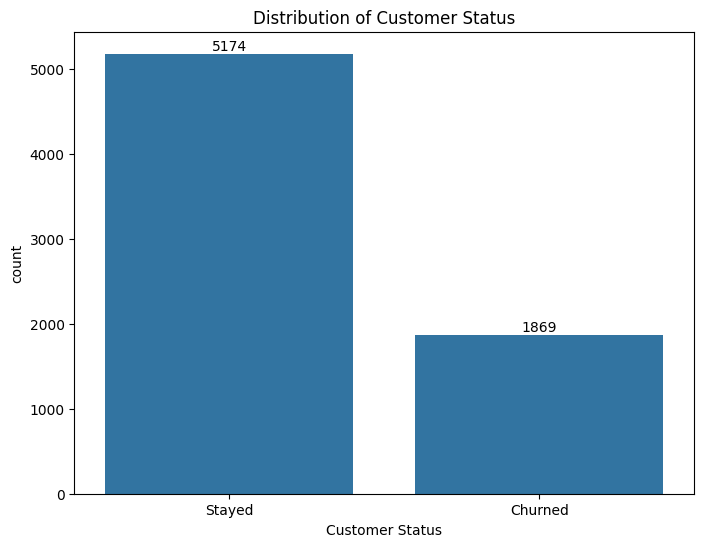

In [ ]:
# Visualize churn distribution
plt.figure(figsize=(8, 6))
ax=sns.countplot(x='Customer Status', data=data)
ax.bar_label(ax.containers[0])
plt.title('Distribution of Customer Status')
plt.show()

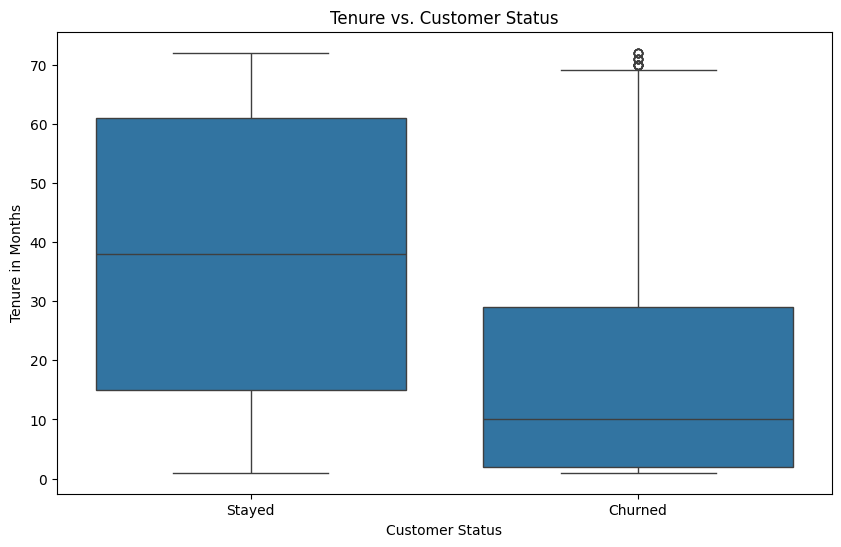

In [ ]:
# Analyze the relationship between tenure and churn
plt.figure(figsize=(10, 6))
sns.boxplot(x='Customer Status', y='Tenure in Months', data=data)
plt.title('Tenure vs. Customer Status')
plt.show()

Understanding the Plot:

The plot is a box plot comparing the tenure (in months) of customers with different customer statuses (likely 0 and 1). The x-axis represents the customer status, and the y-axis represents the tenure in months.

Key Insights:

Median Tenure: Customer Status 0: The median tenure is around 30 months. Customer Status 1: The median tenure is significantly lower, around 10 months. Distribution: Customer Status 0: The distribution is more spread out, with a longer tail on the right, indicating some customers with very high tenures. Customer Status 1: The distribution is more compact, with a shorter tail on the right, suggesting a more concentrated range of tenures. Outliers: There are a few outliers (represented by individual points) in Customer Status 1, indicating customers with exceptionally high tenures compared to the rest of the group. Possible Interpretations:

Customer Retention: The longer median tenure for Customer Status 0 suggests that customers in this group are more likely to remain with the company for a longer period. Customer Churn: The shorter median tenure and more compact distribution for Customer Status 1 indicate a higher likelihood of customer churn. Customer Segmentation: The different tenures and distributions across the two customer statuses suggest that there might be distinct customer segments with varying levels of loyalty or engagement.

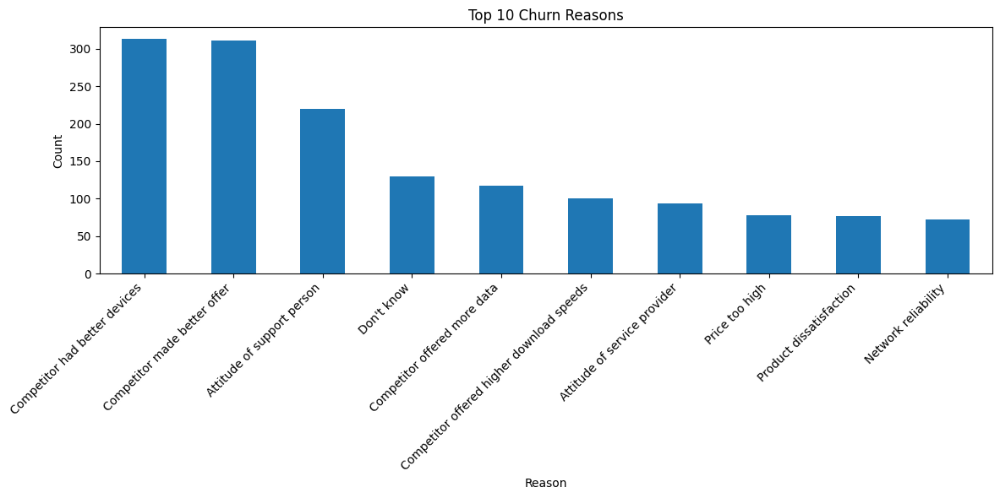

In [ ]:
# Analyze churn reasons
churn_reasons = data[data['Customer Status'] == "Churned"]['Churn Reason'].value_counts().head(10)
plt.figure(figsize=(12, 6))
churn_reasons.plot(kind='bar')
plt.title('Top 10 Churn Reasons')
plt.xlabel('Reason')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Understanding the Chart:

The chart is a bar plot representing the top 10 reasons for customer churn, based on the frequency of mentions. The x-axis lists the reasons, and the y-axis shows the count of customers who cited that reason for leaving.

Key Insights:

Dominant Churn Reasons: "Competitor had better devices" and "Competitor made better offer" are the two most frequently cited reasons for churn, suggesting that competitive pricing and product offerings are significant factors driving customer attrition. "Attitude of support person" and "Attitude of service provider" are also among the top reasons, highlighting the importance of customer service quality in retaining customers. Other Significant Reasons: "Don't know" being a relatively high-ranking reason indicates a need for further investigation into customer satisfaction and churn drivers. "Price too high" and "Product dissatisfaction" are also notable reasons, suggesting that pricing and product quality play a role in customer churn."Competitor offered more data" and "Competitor offered higher download speeds" are also cited, suggesting that these factors also important for customers. "Network reliability" and "Product dissatisfaction" are less frequently mentioned, but they still contribute to customer churn. Possible Interpretations:

Competitive Pressure: The dominance of reasons related to competitors suggests that the company is facing significant competition in the market. Customer Service Importance: The prominence of reasons related to customer service emphasizes the need for improving the quality of support and service interactions. Product and Pricing: Pricing and product satisfaction are also key factors contributing to churn. The company may need to review its pricing strategy and product offerings to address customer needs and preferences. Unknown Reasons: The "Don't know" category highlights the need for further research and analysis to identify additional factors contributing to customer churn.

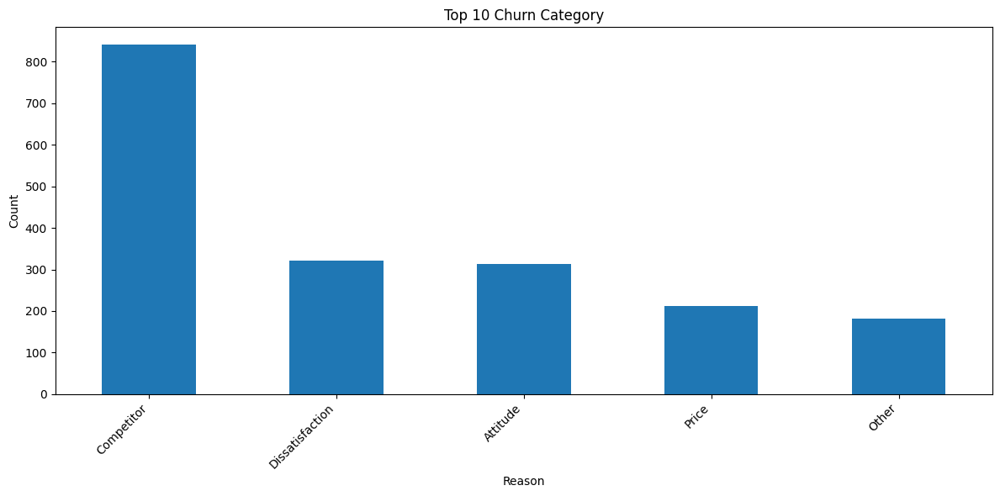

In [ ]:
# Analyze churn Category
churn_reasons = data[data['Customer Status'] == "Churned"]['Churn Category'].value_counts().head(10)
plt.figure(figsize=(12, 6))
churn_reasons.plot(kind='bar')
plt.title('Top 10 Churn Category')
plt.xlabel('Reason')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Understanding the Chart:

The chart is a bar plot representing the top 10 reasons for customer churn, categorized into broader categories: Competitor, Dissatisfaction, Attitude, Price, and Other. The x-axis lists the categories, and the y-axis shows the count of customers who cited a reason within that category.

Key Insights:

Dominant Churn Category: "Competitor" is the most frequently cited category, suggesting that competitive factors play a significant role in customer churn. Other Significant Categories: "Dissatisfaction" and "Attitude" are also notable categories, indicating that customer dissatisfaction with the product or service, as well as negative interactions with customer support, contribute to churn. "Price" is a less frequent category, but it still contributes to customer churn, suggesting that pricing is a factor to consider. "Other" Category: The "Other" category includes a variety of reasons that didn't fall into the top four categories. This might indicate a need for further analysis to identify additional factors contributing to churn. Possible Interpretations:

Competitive Pressure: The dominance of the "Competitor" category suggests that the company is facing significant competition in the market. Customer Satisfaction: The "Dissatisfaction" and "Attitude" categories highlight the importance of customer satisfaction and service quality in retaining customers. Pricing: While less frequent, pricing is still a factor contributing to churn. The company may need to review its pricing strategy to address customer needs and preferences. Other Factors: The "Other" category indicates that there are additional factors contributing to churn that need to be investigated.

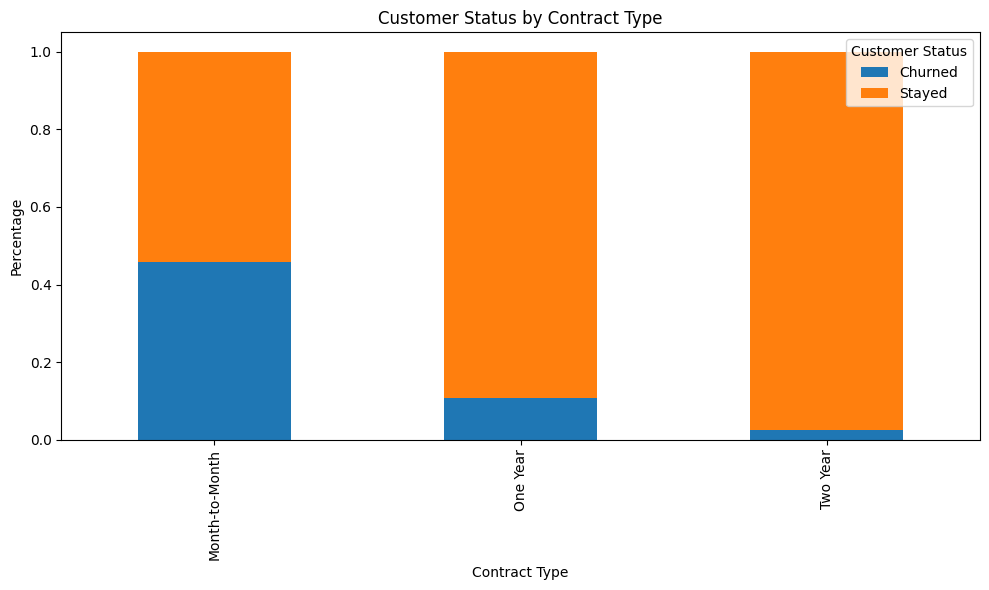

In [ ]:
# Analyze the impact of contract type on churn
contract_churn = data.groupby('Contract')['Customer Status'].value_counts(normalize=True).unstack()
contract_churn.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Customer Status by Contract Type')
plt.xlabel('Contract Type')
plt.ylabel('Percentage')
plt.legend(title='Customer Status')
plt.tight_layout()
plt.show()

Understanding the Chart:

The chart is a stacked bar chart representing the distribution of customer statuses (likely 0 and 1) across different contract types: Month-to-Month, One Year, and Two Year. The x-axis shows the contract types, the y-axis represents the percentage of customers, and the different colors represent the customer statuses.

Key Insights:

Contract Type and Customer Status: Month-to-Month: A higher percentage of customers have Customer Status 1 (likely churned or dissatisfied), suggesting that customers with shorter-term contracts are more likely to leave. One Year: A lower percentage of customers have Customer Status 1 compared to Month-to-Month, indicating a higher retention rate for one-year contracts. Two Year: The lowest percentage of customers have Customer Status 1, suggesting that customers with longer-term contracts are the most likely to stay. Contract Length and Retention: The chart clearly shows that longer-term contracts are associated with higher customer retention rates. Possible Interpretations:

Contractual Commitment: Customers with longer-term contracts may feel more committed to the company and are less likely to churn. Switching Costs: Customers with longer-term contracts may face higher switching costs, making it less likely for them to switch to a competitor. Customer Satisfaction: Customers with longer-term contracts may be more satisfied with the product or service, leading to higher retention rates.

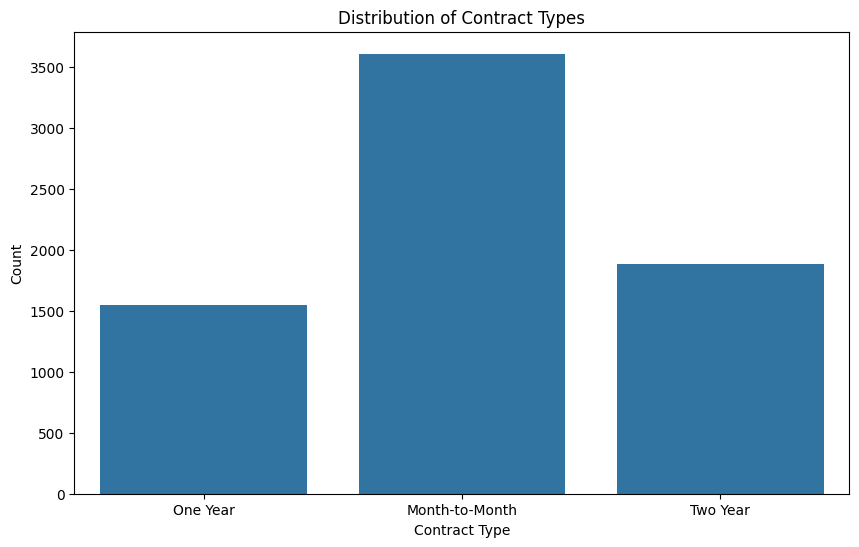

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Contract', data=data)
plt.title('Distribution of Contract Types')
plt.xlabel('Contract Type')
plt.ylabel('Count')
plt.show()

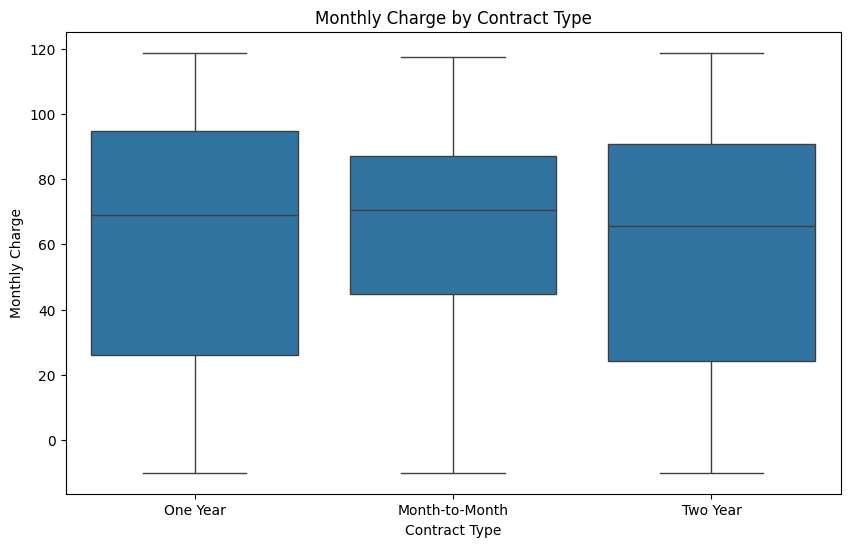

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Contract', y='Monthly Charge', data=data)
plt.title('Monthly Charge by Contract Type')
plt.xlabel('Contract Type')
plt.ylabel('Monthly Charge')
plt.show()

Understanding the Plot:

The plot is a box plot comparing the monthly charge across different contract types: One Year, Month-to-Month, and Two Year. The x-axis represents the contract type, and the y-axis represents the monthly charge.

Key Insights:

Median Monthly Charge: Month-to-Month: The median monthly charge is slightly higher than the other two contract types.One Year and Two Year: These contract types have similar median monthly charges. Distribution:Month-to-Month: The distribution is slightly more compact.One Year and Two Year: These contract types have similar distributions. Outliers: There are a few outliers (represented by individual points) in all contract types, indicating customers with exceptionally high or low monthly charges compared to the rest of the group. Possible Interpretations:

Pricing Strategy: The similar median monthly charges for One Year and Two Year contracts suggest that the company may be using a pricing strategy to attract customers with longer-term commitments. Customer Segmentation: The different distributions across the contract types suggest that there might be distinct customer segments with varying needs and preferences regarding pricing.

In [ ]:
pt2=pd.pivot_table(data,index="Contract",columns="Customer Status",values="Monthly Charge",aggfunc='median');pt2

Customer Status,Churned,Stayed
Contract,,
Month-to-Month,78.800,59.050
One Year,95.050,64.975
Two Year,97.275,65.150


In [ ]:
pd.pivot_table(data,index='Payment Method',columns="Customer Status",values="Total Revenue",aggfunc='mean')

Customer Status,Churned,Stayed
Payment Method,,
Bank Withdrawal,2076.037404,3842.262632
Credit Card,2098.302663,3114.445640
Mailed Check,635.786268,1858.323374


In [ ]:
pt2=pd.pivot_table(data,index="Payment Method",columns="Customer Status",values="Total Refunds",aggfunc='mean');pt2

Customer Status,Churned,Stayed
Payment Method,,
Bank Withdrawal,1.712430,2.420597
Credit Card,1.247789,1.850349
Mailed Check,0.468592,1.585844


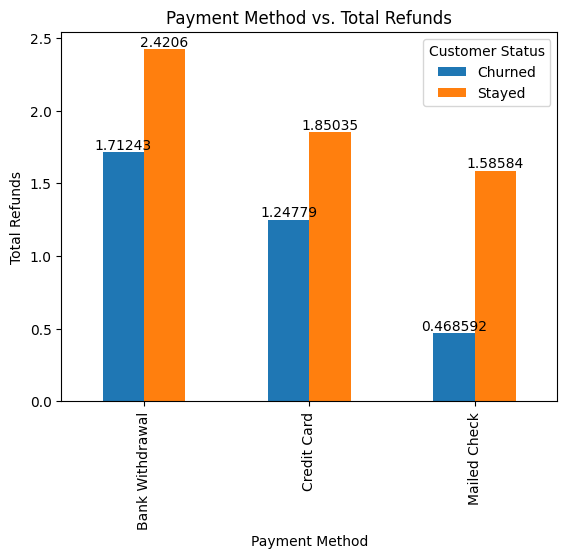

In [ ]:
ax=data.groupby(['Customer Status', 'Payment Method'])['Total Refunds'].mean().unstack("Customer Status").plot(kind='bar', stacked=False)
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
plt.title('Payment Method vs. Total Refunds')
plt.xlabel('Payment Method')
plt.ylabel('Total Refunds')
plt.show()

Understanding the Chart:

The chart is a grouped bar chart comparing the total refunds for different payment methods (Bank Withdrawal, Credit Card, Mailed Check) across two customer statuses (likely 0 and 1). The x-axis represents the payment methods, the y-axis represents the total refunds, and the different colors represent the customer statuses.

Key Insights:

Total Refunds by Payment Method: Bank Withdrawal: The highest total refunds are associated with Bank Withdrawal, regardless of customer status. Credit Card: Total refunds for Credit Card are generally lower than Bank Withdrawal. Mailed Check: The lowest total refunds are associated with Mailed Check. Payment Method and Customer Status: Customer Status 0: There is a significant difference in total refunds between payment methods for this group. Bank Withdrawal has the highest refunds, followed by Credit Card and Mailed Check. Customer Status 1: The differences in total refunds between payment methods are less pronounced for this group. Bank Withdrawal still has the highest refunds, but the gap between payment methods is narrower. Possible Interpretations:

Refund Policies: The differences in total refunds between payment methods might be due to varying refund policies or procedures associated with each method. Customer Behavior: Customers using different payment methods may have different refund patterns or reasons for requesting refunds.The customer who are churned has lower mean refunds in their respective payment method.


In [ ]:
gp1=data.groupby(['Customer Status', 'Payment Method'])['Total Refunds'].mean();gp1

Customer Status  Payment Method 
Churned          Bank Withdrawal    1.712430
                 Credit Card        1.247789
                 Mailed Check       0.468592
Stayed           Bank Withdrawal    2.420597
                 Credit Card        1.850349
                 Mailed Check       1.585844
Name: Total Refunds, dtype: float64

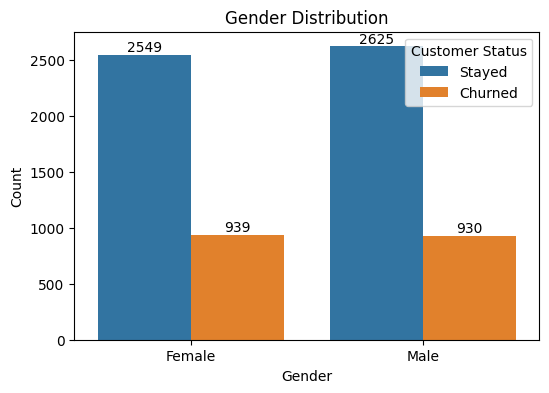

In [ ]:
# 2. Gender Distribution
plt.figure(figsize=(6, 4))
ax=sns.countplot(x='Gender', data=data,hue="Customer Status")
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
plt.title('Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

Understanding the Chart:

The chart is a grouped bar chart representing the distribution of customer statuses (likely 0 and 1) across genders (0 and 1). The x-axis shows the gender, the y-axis represents the count of customers, and the different colors represent the customer statuses.

Key Insights:

Gender Distribution: The overall gender distribution appears to be relatively balanced, with a slightly higher count of customers with Gender 0 (likely male). Customer Status by Gender: Customer Status 0: There is a higher count of customers with Gender 0 compared to Gender 1. Customer Status 1: The count of customers with Gender 0 and Gender 1 is similar, with a slight edge towards Gender 0. Possible Interpretations:

Gender-Based Segmentation: The data suggests that the customer base can be segmented based on gender. Different marketing strategies or product offerings could be tailored to cater to the specific needs and preferences of each gender. Customer Behavior: The higher count of Customer Status 0 (likely stayed or satisfied) among Gender 0 customers might indicate a potential difference in customer behavior or preferences between genders.

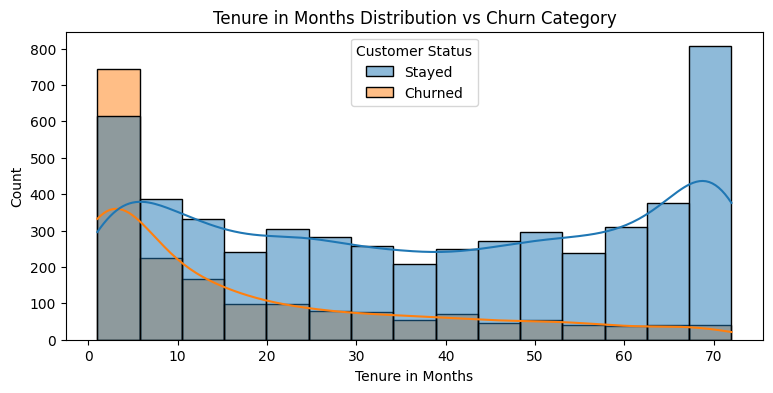

In [ ]:
plt.figure(figsize=(9,4))
sns.histplot(data=data,x='Tenure in Months',hue='Customer Status',kde=True)
plt.title('Tenure in Months Distribution vs Churn Category')
plt.xlabel('Tenure in Months')
plt.ylabel('Count')
plt.show()

Understanding the Plot:

The plot is a combination of histograms and density plots, showing the distribution of tenure in months for two customer statuses (likely 0 and 1) across different tenure ranges. The x-axis represents the tenure in months, and the y-axis represents the count of customers within each tenure range.

Key Insights:

Tenure Distribution: The overall distribution of tenure appears to be right-skewed, meaning there are more customers with shorter tenures compared to longer ones. Customer Status by Tenure: Customer Status 0: This group shows a higher concentration in the mid-range tenures (20-40 months) and then declines as tenure increases. Customer Status 1: This group has a higher concentration in the shorter tenure ranges (0-10 months) and then declines as tenure increases. Density Plot: The density plots provide a smoother representation of the distributions. For Customer Status 0, the density plot peaks in the mid-range tenures and then tapers off. For Customer Status 1, the density plot peaks in the shorter tenure range and then declines. Possible Interpretations:

Customer Churn: The higher concentration of Customer Status 1 (likely churned customers) in the shorter tenure ranges suggests that customers are more likely to churn within the first few months of their subscription. Customer Retention: The higher concentration of Customer Status 0 (likely retained customers) in the mid-range tenures indicates that customers who stay longer are more likely to remain with the company. Customer Lifecycle: The analysis might suggest a customer lifecycle pattern, where customers may be more likely to churn in the early stages of their relationship with the company.

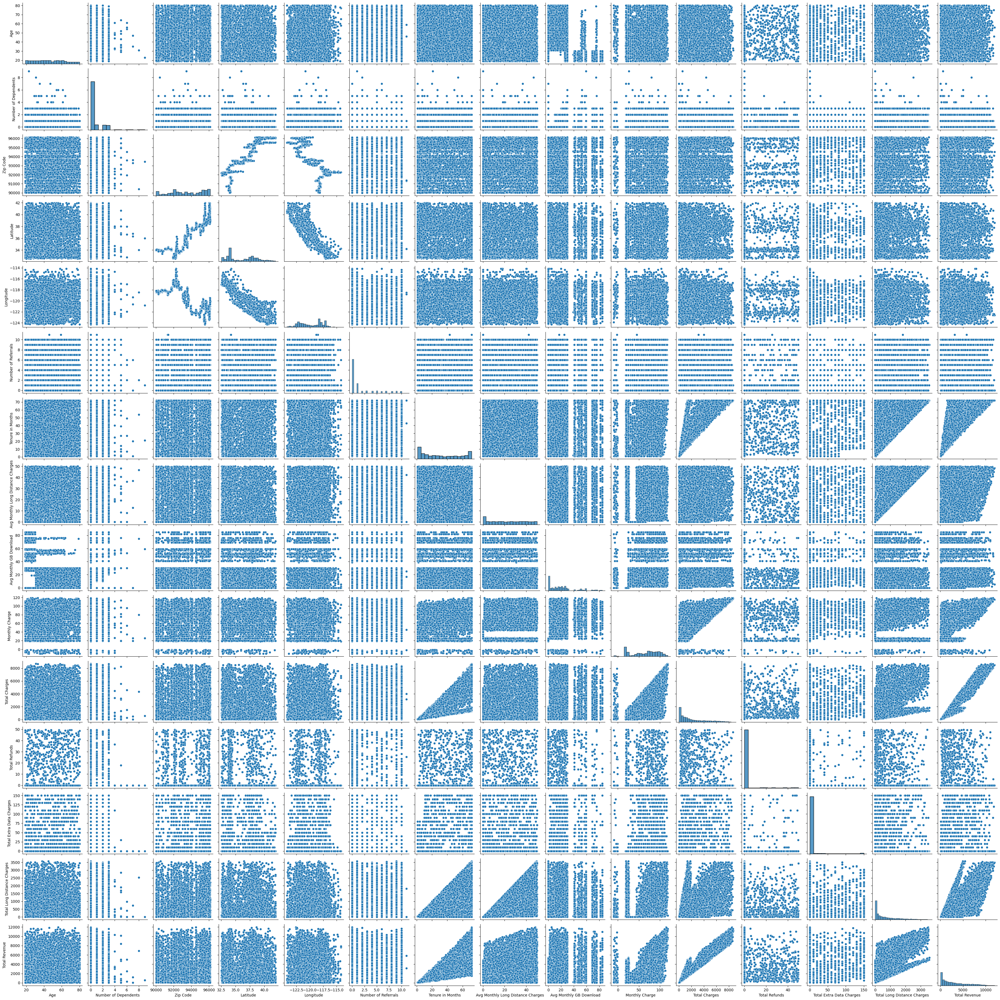

In [ ]:
sns.pairplot(data)

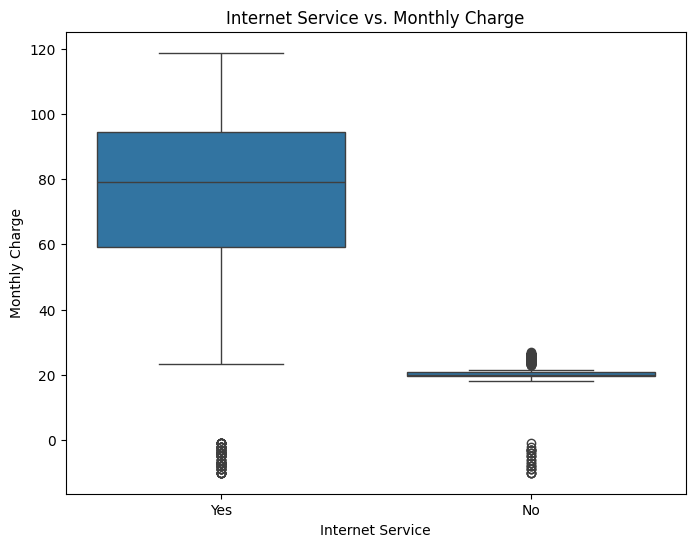

In [ ]:
# 5. Relationship between Internet Service and Monthly Charge
plt.figure(figsize=(8, 6))
sns.boxplot(x='Internet Service', y='Monthly Charge', data=data)
plt.title('Internet Service vs. Monthly Charge')
plt.xlabel('Internet Service')
plt.ylabel('Monthly Charge')
plt.show()

Understanding the Plot:

The plot is a box plot comparing the monthly charge for customers with and without internet service. The x-axis represents the internet service (Yes or No), and the y-axis represents the monthly charge.

Key Insights:

Median Monthly Charge: Yes: The median monthly charge is significantly higher for customers with internet service. No: The median monthly charge is much lower for customers without internet service. Distribution: Yes: The distribution is more spread out, with a longer tail on the right, indicating a wider range of monthly charges for customers with internet service. No: The distribution is more compact, with a shorter tail on the right, suggesting a more concentrated range of monthly charges for customers without internet service. Outliers: There are a few outliers (represented by individual points) in both groups, indicating customers with exceptionally high or low monthly charges compared to the rest of the group. Possible Interpretations:

Pricing Structure: The higher monthly charge for customers with internet service suggests that the company charges a premium for internet access. Additional Services: Customers with internet service may also be subscribing to additional services or packages, contributing to the higher monthly charge. Customer Segmentation: The different distributions across the two groups suggest that there might be distinct customer segments with varying needs and preferences regarding internet service and pricing.

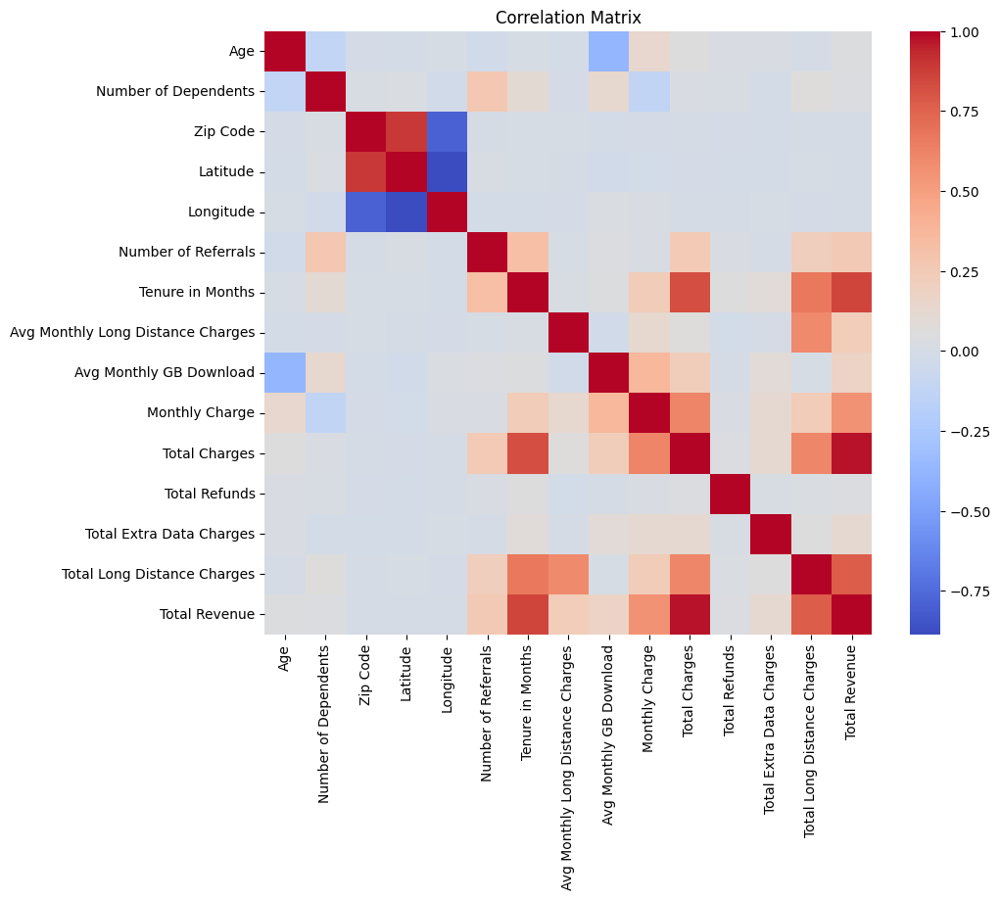

In [ ]:
# 6. Correlation Matrix
correlation_matrix = data.corr(numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

Understanding the Plot:

The plot is a correlation matrix, which visually represents the relationships between different variables in a dataset. Each square in the matrix represents the correlation between two variables, with colors indicating the strength and direction of the correlation:

Red: Positive correlation (variables increase or decrease together) Blue: Negative correlation (one variable increases as the other decreases) White: No correlation Key Insights:

Strong Positive Correlations: Total Charges and Total Revenue have a strong positive correlation, as expected, since total revenue is likely calculated based on total charges. Tenure in Months and Total Charges have a moderate positive correlation, suggesting that customers with longer tenures tend to have higher total charges. Other Notable Correlations:Latitude and Total Revenue have a moderate negative correlation, indicating that customers in certain geographic locations might have lower total revenue. Possible Interpretations:

Customer Behavior: The correlations between tenure, total charges, and total revenue provide insights into customer behavior and churn patterns. Pricing and Revenue: The strong correlation between total charges and total revenue highlights the importance of pricing strategies in generating revenue. Customer Segmentation: The correlations between demographics (number of dependents), and geographic location suggest that the customer base can be segmented based on these factors.

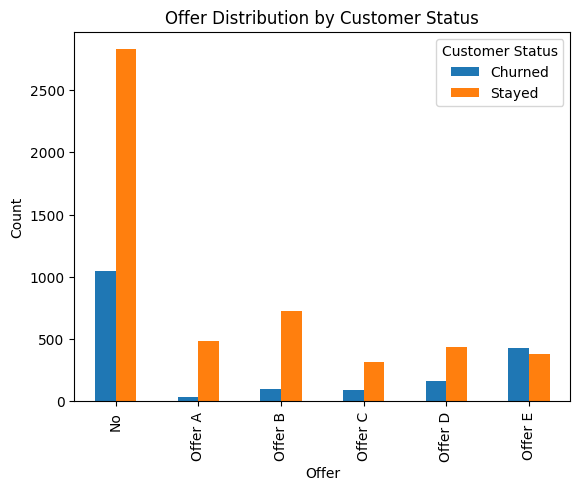

In [ ]:
data.groupby(['Customer Status', 'Offer'])['Offer'].value_counts().unstack("Customer Status").plot(kind='bar', stacked=False)
plt.title('Offer Distribution by Customer Status')
plt.xlabel('Offer')
plt.ylabel('Count')
plt.show()

Understanding the Chart:

The chart is a grouped bar chart representing the distribution of customer statuses (Churned and Stayed) across different offers (No Offer, Offer A, Offer B, Offer C, Offer D, Offer E). The x-axis shows the offers, the y-axis represents the count of customers, and the different colors represent the customer statuses.

Key Insights:

Offer Effectiveness: No Offer: A significant number of customers who were not offered any promotion or discount have churned. Offer A: While the number of customers who churned after receiving Offer A is lower than those with no offer.Offer Comparison: Offer A & B appears to be the most effective in retaining customers, with the lowest number of churned customers. Customer Status Distribution: Churned: The distribution varies across offers, with higher counts for No Offer and  higher proportion for Offer E. Stayed: The distribution is relatively consistent across most offers, except for Offer A & B, which has a significantly higher proportion of retained customers. Possible Interpretations:

Offer Impact: The chart suggests that offering promotions or discounts can be effective in retaining customers, but the specific offer type and its value can influence the impact. Customer Segmentation: Different offers might appeal to different customer segments, and tailoring offers to specific customer needs could improve retention rates. Customer Behavior: Customers who are not offered any promotions or discounts might be more price-sensitive and more likely to churn.

In [ ]:
data.groupby('Customer Status')['Avg Monthly Long Distance Charges'].mean()

,Avg Monthly Long Distance Charges
Customer Status,
Churned,23.167635
Stayed,22.883572


<Axes: xlabel='Internet Type'>

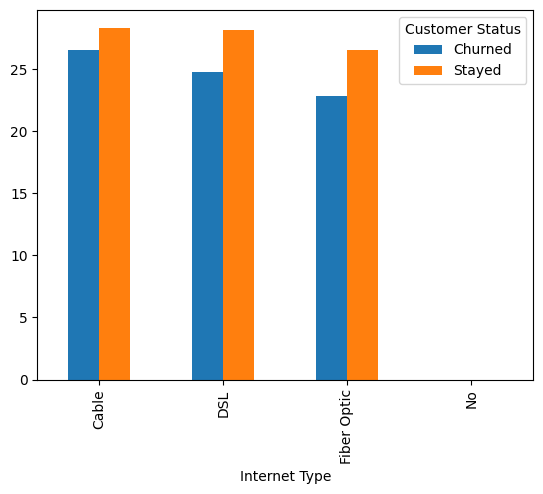

In [ ]:
data.groupby(['Customer Status',"Internet Type"])['Avg Monthly GB Download'].mean().unstack("Customer Status").plot(kind='bar', stacked=False)

Key Insights:

Internet Type and Churn: Cable and DSL: These internet types have higher percentages of churned customers compared to Fiber Optic and No Internet. Fiber Optic: Customers with Fiber Optic internet appear to have a lower churn rate. No Internet: The category with "No" internet service has a relatively low churn rate, but it's difficult to interpret without additional context about the reasons for not having internet service. Customer Status Distribution: Churned: The distribution varies across internet types, with higher counts for Cable and DSL. Stayed: The distribution is relatively consistent across most internet types, with a slightly higher count for Fiber Optic. Possible Interpretations:

Internet Service Quality: The higher churn rate for Cable and DSL might indicate that these internet types are associated with lower quality or reliability, leading to customer dissatisfaction. Customer Segmentation: Different internet types might appeal to different customer segments with varying needs and preferences. Pricing: The pricing of different internet types could also influence customer churn. Customers who are dissatisfied with the price of their current internet service might be more likely to churn.

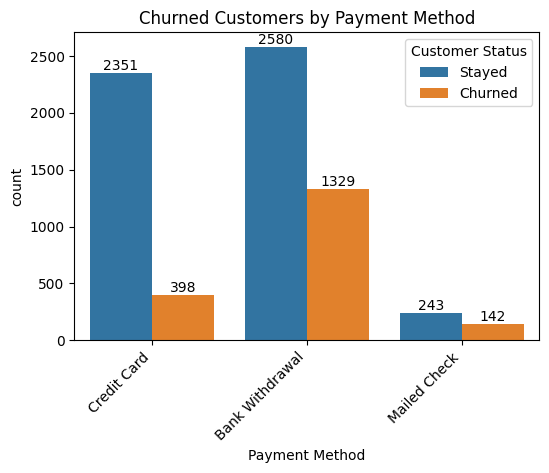

In [ ]:
plt.figure(figsize=(6,4))
ax=sns.countplot(x='Payment Method', data=data,hue="Customer Status")
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
plt.title('Churned Customers by Payment Method')
plt.xticks(rotation=45, ha='right')
plt.show()

Understanding the Chart:

The chart is a grouped bar chart representing the distribution of customer statuses (Churned and Stayed) across different payment methods (Bank Withdrawal, Credit Card, Mailed Check). The x-axis shows the payment methods, the y-axis represents the count of customers, and the different colors represent the customer statuses.

Key Insights:

Payment Method and Churn: Bank Withdrawal: A higher percentage of customers who use Bank Withdrawal and Mailed Check have churned compared to Credit Card . Credit Card: These payment method has lower churn rate, with Credit Card having the lowest churn rate. Customer Status Distribution: Churned: The distribution varies across payment methods, with a higher count for Bank Withdrawal. Stayed: The distribution is relatively consistent across most payment methods, with a slightly higher count for Credit Card. Possible Interpretations:

Payment Method and Customer Behavior: Customers who use Bank Withdrawal and Mailed Check might have different characteristics or behaviors compared to those who use Credit Card or Mailed Check. Payment Convenience: Customers who prefer Credit Card might find these methos more convenient or secure, leading to higher satisfaction and lower churn rates. Fraud Detection: The higher churn rate for Bank Withdrawal might indicate a higher incidence of fraudulent transactions or chargebacks associated with this payment method.

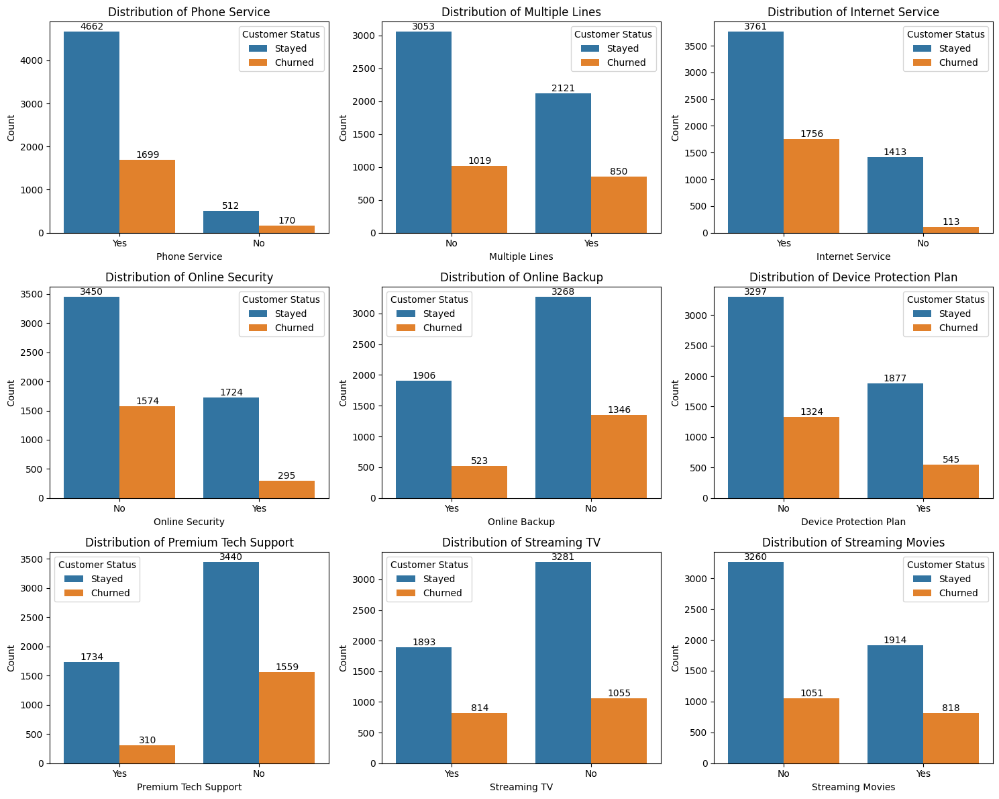

In [ ]:
6columns=["Phone Service","Multiple Lines","Internet Service","Online Security","Online Backup","Device Protection Plan","Premium Tech Support","Streaming TV","Streaming Movies"]
n_cols=3
n_rows=(len(columns)+n_cols-1)//n_cols
fig,axes=plt.subplots(n_rows,n_cols,figsize=(15,4*n_rows))
axes=axes.flatten()
for i,col in enumerate(columns):
    ax=sns.countplot(data=data,x=col,hue="Customer Status",ax=axes[i])
    ax.bar_label(ax.containers[0])
    ax.bar_label(ax.containers[1])
    axes[i].set_title(f"Distribution of {col}")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Count")
for j in range(i+1,len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

Key Insights:

Service Usage and Churn:

Phone Service: Customers with Phone Service have a higher churn rate compared to those without. Multiple Lines: Customers with Multiple Lines have a slightly higher churn rate than those with a single line. Internet Service: Customers with Internet Service have a higher churn rate compared to those without. Online Security, Online Backup, Device Protection Plan: Customers who subscribe to these additional services have a lower churn rate, suggesting that these services might be valuable in retaining customers. Premium Tech Support, Streaming TV, Streaming Movies: The impact of these services on churn is less clear, with mixed results. Customer Status Distribution:

Churned: The distribution varies across different services, with higher churn rates for some services (e.g., Phone Service, Multiple Lines, Internet Service) and lower churn rates for others (e.g., Online Security, Online Backup, Device Protection Plan). Stayed: The distribution is relatively consistent across most services, with slightly higher counts for customers who subscribe to additional services. Possible Interpretations:

Service Bundling: Customers who subscribe to multiple services might be more likely to churn if they are dissatisfied with any one of them. Value-Added Services: Offering additional services like Online Security, Online Backup, and Device Protection Plan might be effective in retaining customers. Customer Segmentation: Different customer segments might have varying needs and preferences for different services, and tailoring offerings to these segments could improve retention.

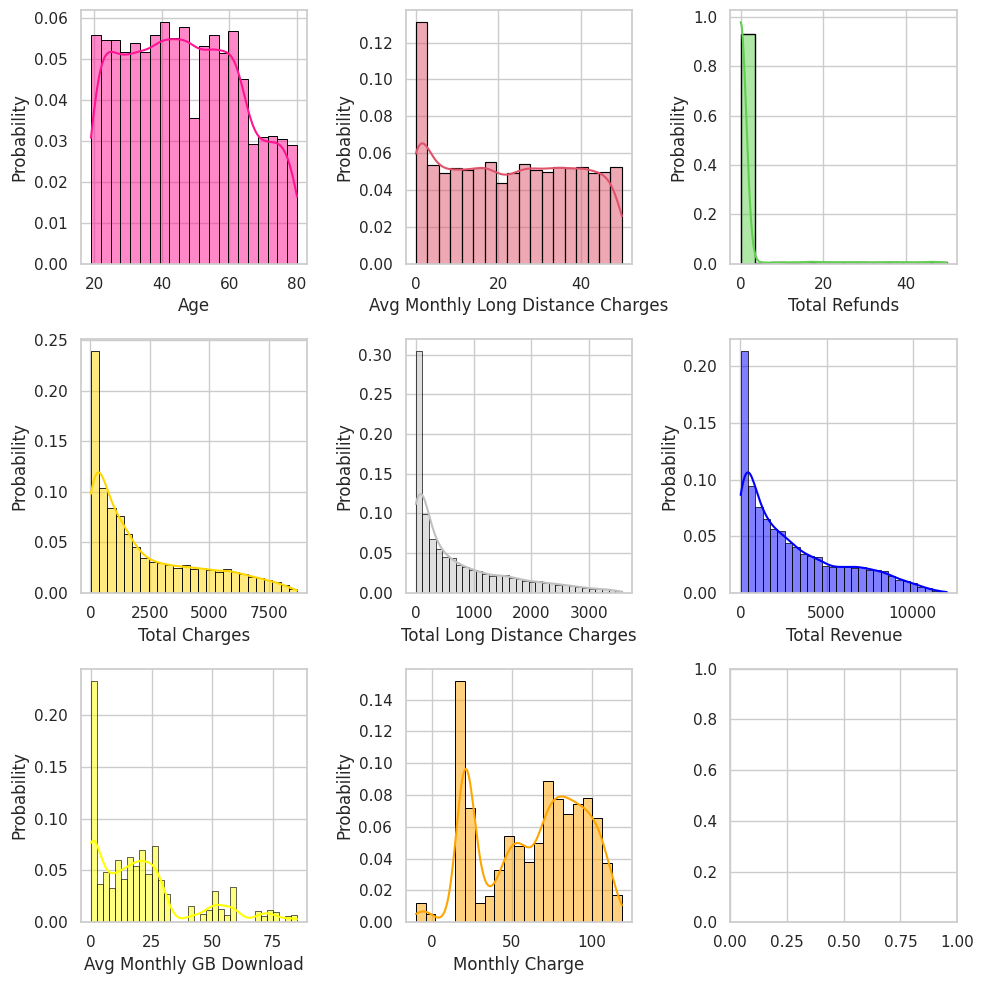

In [ ]:
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
sns.set(style="whitegrid")
fig,axs = plt.subplots(3,3, figsize = (10,10))
sns.histplot(data=data, x="Age",stat = "probability",kde=True, color="#FF1493",edgecolor = "black", ax=axs[0, 0])
sns.histplot(data=data, x="Avg Monthly Long Distance Charges",stat = "probability", kde=True, color="#DF536B",edgecolor = "black", ax=axs[0, 1])
sns.histplot(data=data, x="Total Refunds",stat = "probability", kde=True, color="#61D04F",edgecolor = "black", ax=axs[0, 2])
sns.histplot(data=data, x="Total Charges",stat = "probability", kde=True, color="gold",edgecolor = "black", ax=axs[1,0])
sns.histplot(data=data, x="Total Long Distance Charges",stat = "probability", kde=True, color="silver",edgecolor = "black", ax=axs[1,1])
sns.histplot(data=data, x="Total Revenue",stat = "probability", kde=True, color="blue",edgecolor = "black", ax=axs[1,2])
sns.histplot(data=data, x="Avg Monthly GB Download",stat = "probability", kde=True, color="yellow",edgecolor = "black", ax=axs[2,0])
sns.histplot(data=data, x="Monthly Charge",stat = "probability", kde=True, color="orange",edgecolor = "black", ax=axs[2,1])
fig.tight_layout()

The provided image shows a series of histograms that visualize the distribution of various customer attributes and charges from a telecommunications dataset. Here are some insights based on the plots:

Age: The distribution is skewed to the right, indicating that there are more older customers compared to younger ones.

Average Monthly Long Distance Charges: The distribution is also skewed to the right, suggesting that a majority of customers incur low long-distance charges, while a smaller group incurs significantly higher charges.

Total Refunds: The distribution is heavily skewed to the right, with a large number of customers receiving no refunds and a smaller group receiving substantial refunds. This might indicate a systematic issue or a significant number of customer disputes.

Total Charges: The distribution appears to be roughly bell-shaped, suggesting a relatively normal distribution of total charges among customers.

Total Long Distance Charges: Similar to the total charges, the distribution is approximately bell-shaped, indicating a normal distribution of long-distance charges.

Total Revenue: The distribution is skewed to the right, with a majority of customers generating lower revenue and a smaller group generating significantly higher revenue. This might be due to factors like usage plans, additional services, or customer segmentation.

Average Monthly GB Download: The distribution is skewed to the right, suggesting that a majority of customers use a relatively small amount of data, while a smaller group downloads significantly more data. This could be attributed to different usage patterns, plan limitations, or pricing strategies.

Monthly Charge: The distribution is skewed to the right, with a majority of customers paying lower monthly charges and a smaller group paying significantly higher charges. This might be due to different plans, add-ons, or usage-based pricing.

Overall, the histograms reveal valuable information about the customer base and their usage patterns. Further analysis could help identify customer segments, assess the effectiveness of pricing strategies, and identify areas for improvement in customer service or product offerings.

In [ ]:
import plotly.express as px
grouped_data = data.groupby('Customer Status')['Customer ID'].nunique().reset_index()
fig = px.pie(grouped_data,
             values='Customer ID',
             names='Customer Status',
             color_discrete_sequence=px.colors.qualitative.Set3,
             hole=0.4,
             title='Churn Distribution')
fig.update_traces(marker=dict(line=dict(color='white', width=2)))
fig.show()

In [ ]:
fig = px.pie(data.groupby(['Contract','Customer Status'])['Customer ID'].count().reset_index(),
            values='Customer ID',
            names='Contract',
            facet_col = 'Customer Status',
            color_discrete_sequence=px.colors.qualitative.Set2,
            title = 'Churn rate by contract type')

fig.show()

Key Insights:

Churn Rate by Contract Type: Month-to-Month: The highest churn rate is observed for Month-to-Month contracts, indicating that customers with shorter-term commitments are more likely to churn. One Year: The churn rate for One Year contracts is lower than Month-to-Month but higher than Two Year. Two Year: The lowest churn rate is associated with Two Year contracts, suggesting that customers with longer-term commitments are more likely to stay. Customer Retention: Month-to-Month: Only 8.88% of customers with Month-to-Month contracts stay, indicating a high churn rate. One Year: 37.8% of customers with One Year contracts stay. Two Year: A significantly higher percentage (88.6%) of customers with Two Year contracts stay, demonstrating the effectiveness of longer-term contracts in retaining customers. Possible Interpretations:

Contractual Commitment: Customers with longer-term contracts may feel more committed to the company and are less likely to churn. Switching Costs: Customers with longer-term contracts might face higher switching costs, making it less likely for them to switch to a competitor. Customer Satisfaction: Customers with longer-term contracts may be more satisfied with the product or service, leading to higher retention rates.

In [ ]:
fig = px.pie(data.groupby(['Internet Type','Customer Status'])['Customer ID'].count().reset_index(),
             values='Customer ID',
             facet_col = 'Customer Status',
             names='Internet Type',
             color_discrete_sequence=px.colors.qualitative.Set1,
             title = 'What type of internet was connected to the clients who left the service?')
fig.show()

Key Insights:

Internet Type and Churn: Fiber Optic: Customers with Fiber Optic internet have the lowest churn rate, suggesting that it might be a more reliable or attractive internet option. DSL and Cable: These internet types have higher churn rates compared to Fiber Optic, indicating potential issues with quality or reliability. No Internet: The category with "No" internet service has a relatively low churn rate, but it's difficult to interpret without additional context about the reasons for not having internet service. Customer Retention: Fiber Optic: A higher percentage of customers with Fiber Optic internet stay, demonstrating its effectiveness in retaining customers. DSL and Cable: Customers with these internet types are more likely to churn. No Internet: The retention rate for customers with "No" internet service is relatively high, but it's difficult to draw conclusions without more information. Possible Interpretations:

Internet Service Quality: The higher churn rate for DSL and Cable might indicate that these internet types are associated with lower quality or reliability, leading to customer dissatisfaction. Customer Segmentation: Different internet types might appeal to different customer segments with varying needs and preferences. Pricing: The pricing of different internet types could also influence customer churn. Customers who are dissatisfied with the price of their current internet service might be more likely to churn.

In [ ]:
fig = px.pie(data.groupby(['Premium Tech Support','Customer Status'])['Customer ID'].count().reset_index(),
             values='Customer ID',
             facet_col = 'Customer Status',
             hole = .5,
             names='Premium Tech Support',
             title = 'A big pie chart')
fig.show()

Key Insights:

Customer Churn: The left chart shows that a relatively small percentage of customers (16.6%) churned. The majority of customers (83.4%) stayed. Customer Retention: The right chart indicates that a significant portion of customers (66.5%) stayed. Only 33.5% of customers churned. Possible Interpretations:

Overall Customer Satisfaction: The high retention rate suggests that a majority of customers are satisfied with the product or service. Churn Factors: Identifying the reasons for the 16.6% of customers who churned would be crucial for improving customer retention. Customer Segmentation: Analyzing the factors that influence customer churn (e.g., demographics, service usage) could help identify specific customer segments that require more attention.

In [ ]:
fig = px.bar(data.groupby(['Internet Type','Online Security',
                                                'Customer Status'])['Customer ID'].count().reset_index(),
             x="Internet Type",
             y="Customer ID",
             color="Customer Status",
             #barmode="group",
             text = 'Customer ID',
             facet_col = 'Online Security',
             color_continuous_scale="Bluered"
            )
fig.show()

Key Insights:

Online Security and Churn: Online Security No: Customers without Online Security have a higher churn rate across all internet types compared to those with Online Security. Online Security Yes: Customers with Online Security have a lower churn rate across all internet types. Internet Type and Churn: Fiber Optic: Customers with Fiber Optic internet have a lower churn rate, regardless of whether they have Online Security. Cable and DSL: These internet types have higher churn rates, especially for customers without Online Security. No Internet: The category with "No" internet service has a relatively low churn rate, but it's difficult to interpret without additional context. Customer Status Distribution: Churned: The distribution varies across both internet types and Online Security status. Customers with Cable or DSL internet and without Online Security have the highest churn rates. Stayed: The distribution is relatively consistent across internet types for customers with Online Security, suggesting that this service might be effective in retaining customers. Possible Interpretations:

Online Security as a Retention Tool: Offering Online Security might be an effective way to retain customers, especially for those with Cable or DSL internet. Internet Service Quality: The higher churn rates for Cable and DSL, especially for customers without Online Security, might indicate that these internet types are associated with lower quality or reliability. Customer Segmentation: Different customer segments might have varying needs and preferences for internet services and additional features.

In [ ]:
fig = px.bar(data.groupby(['Payment Method','Internet Type'])['Customer ID'].count().reset_index(),
             x='Payment Method',
             y='Customer ID',
             facet_col = 'Internet Type',
             color = 'Customer ID',
             color_continuous_scale="Bluered",
             text = 'Customer ID')
fig.show()

Key Insights:

Internet Type and Payment Method: Cable: Customers with Cable internet primarily use Bank Withdrawal and Credit Card. DSL: Customers with DSL internet also predominantly use Bank Withdrawal and Credit Card, with a smaller proportion using Mailed Check. Fiber Optic: Customers with Fiber Optic internet predominantly use Bank Withdrawal and Credit Card, with a very small proportion using Mailed Check. No Internet: Customers without internet service primarily use Mailed Check, with a small proportion using Bank Withdrawal. Customer Churn by Payment Method and Internet Type: Bank Withdrawal: Customers using Bank Withdrawal have a higher churn rate across all internet types. Credit Card: Customers using Credit Card have a lower churn rate across all internet types. Mailed Check: The churn rate for Mailed Check varies by internet type. It's highest for customers without internet service and lowest for those with Fiber Optic. Possible Interpretations:

Payment Method Preferences: The choice of payment method might be influenced by factors like customer demographics, location, and internet type. Payment Method and Churn: Customers using Bank Withdrawal might be more likely to churn due to various reasons, such as fraud concerns or payment issues. Internet Type and Payment Method: The combination of internet type and payment method might influence customer satisfaction and churn. For example, customers with Fiber Optic internet might have a lower churn rate due to a combination of reliable internet service and convenient payment options.

In [ ]:
grouped_data = data.groupby(['Internet Type', 'Payment Method']).size().reset_index(name='Customer Count')
total_counts = grouped_data.groupby('Internet Type')['Customer Count'].transform('sum')
grouped_data['Percentage'] = grouped_data['Customer Count'] / total_counts * 100
fig = px.bar(grouped_data,
             x='Internet Type',
             y='Percentage',
             color='Payment Method',
             text='Percentage',
             title='Distribution of Payment Methods by Internet Type (Percentage)',
             labels={'Percentage': 'Percentage of Customers (%)', 'Internet Type': 'Internet Type'})
fig.update_traces(texttemplate='%{text:.2f}%', textposition='inside')
fig.update_layout(yaxis_title='Percentage of Customers (%)', xaxis_title='Internet Type', barmode='stack')

fig.show()

Key Insights:

Payment Method Preferences by Internet Type: Cable: Customers with Cable internet predominantly use Credit Card, followed by Bank Withdrawal and Mailed Check. DSL: The distribution of payment methods for DSL customers is similar to Cable, with Credit Card being the most popular. Fiber Optic: Customers with Fiber Optic internet also primarily use Credit Card, but Bank Withdrawal is more popular than Mailed Check. No Internet: Customers without internet service primarily use Bank Withdrawal, followed by Credit Card and Mailed Check. Payment Method Usage: Bank Withdrawal: Bank Withdrawal is the most popular payment method for customers without internet service and is used by a significant portion of customers with Cable and DSL. Credit Card: Credit Card is the most popular payment method for customers with Fiber Optic internet and is used by a significant portion of customers with Cable and DSL. Mailed Check: Mailed Check is the least popular payment method overall, with the highest usage among customers without internet service. Possible Interpretations:

Payment Method Availability: The availability of different payment methods might be influenced by the internet type. For example, customers without internet service might have limited options for online payments. Customer Preferences: Customers with different internet types might have varying preferences for payment methods based on factors like convenience, security, or familiarity. Payment Method and Churn: The choice of payment method might be related to customer churn. Further analysis could explore if certain payment methods are associated with higher or lower churn rates.

In [ ]:
# load statmodels functions
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# compute the vif for all given features
def compute_vif(considered_features):

    X =data[['Age','Number of Dependents','Number of Referrals','Tenure in Months','Avg Monthly Long Distance Charges','Total Refunds','Total Extra Data Charges','Total Revenue','Avg Monthly GB Download','Monthly Charge']]
    # the calculation of variance inflation requires a constant
    X['intercept'] = 1

    # create dataframe to store vif values
    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif = vif[vif['Variable']!='intercept']
    return vif

compute_vif(['Age','Number of Dependents','Number of Referrals','Tenure in Months','Avg Monthly Long Distance Charges','Total Refunds','Total Extra Data Charges','Total Revenue','Avg Monthly GB Download','Monthly Charge'])


<ipython-input-5-d4b7430de220>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


,Variable,VIF
0,Age,1.312106
1,Number of Dependents,1.153350
2,Number of Referrals,1.200703
3,Tenure in Months,6.817551
4,Avg Monthly Long Distance Charges,1.329710
5,Total Refunds,1.006580
6,Total Extra Data Charges,1.025215
7,Total Revenue,9.562617
8,Avg Monthly GB Download,1.563301
9,Monthly Charge,2.644322


In [ ]:
data.columns
##unimportant= [total extra data charges, streaming movies, premium tech support, phone service, gender, number of dependents, internet service, multiple lines, 'Online Backup', 'Device Protection Plan',]
# onehot encode=[offer,internet, contract, payment method ]

Index(['Customer ID', 'Gender', 'Age', 'Married', 'Number of Dependents',
       'City', 'Zip Code', 'Latitude', 'Longitude', 'Number of Referrals',
       'Tenure in Months', 'Offer', 'Phone Service',
       'Avg Monthly Long Distance Charges', 'Multiple Lines',
       'Internet Service', 'Internet Type', 'Avg Monthly GB Download',
       'Online Security', 'Online Backup', 'Device Protection Plan',
       'Premium Tech Support', 'Streaming TV', 'Streaming Movies',
       'Streaming Music', 'Unlimited Data', 'Contract', 'Paperless Billing',
       'Payment Method', 'Monthly Charge', 'Total Charges', 'Total Refunds',
       'Total Extra Data Charges', 'Total Long Distance Charges',
       'Total Revenue', 'Customer Status', 'Churn Category', 'Churn Reason',
       'AgeGroup'],
      dtype='object')

In [ ]:
#cont_features=["Avg Monthly Long Distance Charges","Total Refunds","Total Charges","Total Long Distance Charges","Total Revenue","Avg Monthly GB Download","Monthly Charge"]

In [ ]:
data.head()

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason,AgeGroup
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,9,No,Yes,42.39,No,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN,Adult
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,9,No,Yes,10.69,Yes,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN,Adult
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices,Mid-Age Adult
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction,Senior Citizen
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,No,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability,Senior Citizen


In [ ]:
#Mapping

data['Gender']=data['Gender'].map({'Male':1,'Female':0})
data['Customer Status']=data['Customer Status'].map({'Churned':1,'Stayed':0})
data['Married'] = data['Married'].map({'Yes': 1, 'No': 0})
data['Phone Service'] = data['Phone Service'].map({'Yes': 1, 'No': 0})
data['Multiple Lines']=data['Multiple Lines'].map({'Yes': 1, 'No': 0})
data['Internet Service']=data['Internet Service'].map({'Yes': 1, 'No': 0})
data['Online Backup']=data['Online Backup'].map({'Yes': 1, 'No': 0})
data['Online Security']=data['Online Security'].map({'Yes': 1, 'No': 0})
data['Device Protection Plan']=data['Device Protection Plan'].map({'Yes': 1, 'No': 0})
data['Premium Tech Support']=data['Premium Tech Support'].map({'Yes': 1, 'No': 0})
data['Streaming TV']=data['Streaming TV'].map({'Yes': 1, 'No': 0})
data['Streaming Movies']=data['Streaming Movies'].map({'Yes': 1, 'No': 0})
data['Streaming Music']=data['Streaming Music'].map({'Yes': 1, 'No': 0})
data['Unlimited Data']=data['Unlimited Data'].map({'Yes': 1, 'No': 0})
data['Paperless Billing']=data['Paperless Billing'].map({'Yes': 1, 'No': 0})


In [ ]:
import plotly.express as px
fig1=px.histogram(data,
                x='Age',
                  animation_frame='Gender',
                marginal='box',
                color="Customer Status",
                color_discrete_sequence=['blue', 'purple'],
                   title='Age distribution')
fig1.update_layout(bargap=0.1)
fig1.show()

In [ ]:
#Get dummies
data= pd.get_dummies(data,columns=['Offer','Internet Type','Contract', 'Payment Method'], dtype=int, drop_first=True)

In [ ]:
#Dropping irrevant column
data=data.drop(columns=["Churn Category",'Churn Reason','Customer ID',"City","Zip Code","Latitude","Longitude","Age Group",Total Revenue"])


In [ ]:
data.head()

,Gender,Age,Married,Number of Dependents,Number of Referrals,Tenure in Months,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Paperless Billing,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Customer Status,Offer_Offer A,Offer_Offer B,Offer_Offer C,Offer_Offer D,Offer_Offer E,Internet Type_DSL,Internet Type_Fiber Optic,Internet Type_No,Contract_One Year,Contract_Two Year,Payment Method_Credit Card,Payment Method_Mailed Check
0,0,37,1,0,2,9,1,42.39,0,1,16.0,0,1,0,1,1,0,0,1,1,65.6,593.30,0.00,0,381.51,0,0,0,0,0,0,0,0,0,1,0,1,0
1,1,46,0,0,0,9,1,10.69,1,1,10.0,0,0,0,0,0,1,1,0,0,-4.0,542.40,38.33,10,96.21,0,0,0,0,0,0,0,0,0,0,0,1,0
2,1,50,0,0,0,4,1,33.65,0,1,30.0,0,0,1,0,0,0,0,1,1,73.9,280.85,0.00,0,134.60,1,0,0,0,0,1,0,1,0,0,0,0,0
3,1,78,1,0,1,13,1,27.82,0,1,4.0,0,1,1,0,1,1,0,1,1,98.0,1237.85,0.00,0,361.66,1,0,0,0,1,0,0,1,0,0,0,0,0
4,0,75,1,0,3,3,1,7.38,0,1,11.0,0,0,0,1,1,0,0,1,1,83.9,267.40,0.00,0,22.14,1,0,0,0,0,0,0,1,0,0,0,1,0


In [ ]:

##....................
##Model Building Using SMOTE
##.....................

In [ ]:
#Here im using imblearn pipeline
#insted of pipeline because it handle sampling properly
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score

In [ ]:
#dividing input and output
x=data.drop(['Customer Status'],axis=1)
y=data['Customer Status']

In [ ]:
from sklearn.preprocessing import StandardScaler
std=StandardScaler()
x_train_std=std.fit_transform(x)

In [ ]:
#lOGISTIC REGESSION
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression(C=10, penalty= 'l2', solver= 'lbfgs')
resampling=SMOTE()
pipeline=Pipeline([('SMOTE',resampling),('LOGISTIC' ,lr)])
scores=cross_val_score(pipeline,x_train_std,y,scoring='f1',cv=5)

import numpy as np
print('Average Score is:',scores.mean())
print('Standard Deviation of score:',np.std(scores))

Average Score is: 0.6891776251143356
Standard Deviation of score: 0.014680617402106525


In [ ]:
#Support Vector Machine
from sklearn.svm import SVC
svc=SVC(kernel='rbf',C=0.2)
resampling=SMOTE()
pipeline=Pipeline([('SMOTE',resampling),('SVC' ,svc)])
scores=cross_val_score(pipeline,x_train_std,y,scoring='f1',cv=5)
scores.mean()

0.6825498670761767

In [ ]:
#KNN Classifier
from sklearn.neighbors import KNeighborsClassifier
KNN_model_default = KNeighborsClassifier()
resampling=SMOTE()
pipeline=Pipeline([('SMOTE',resampling),('KNN' ,KNN_model_default)])
scores=cross_val_score(pipeline,x_train_std,y,scoring='f1',cv=5)
scores.mean()

0.6043842467889667

In [ ]:
#Gaussian Naive Bayes
from sklearn.naive_bayes import GaussianNB,BernoulliNB,CategoricalNB
nb=GaussianNB()
resampling=SMOTE()
pipeline=Pipeline([('SMOTE',resampling),('BAYES' ,nb)])
scores=cross_val_score(pipeline,x_train_std,y,scoring='f1',cv=5)
scores.mean()

0.6534002671620653

In [ ]:
#LightGBM

from lightgbm import LGBMClassifier
lgb=LGBMClassifier(colsample_bytree=1.0, learning_rate= 0.05, max_depth= -1, min_child_samples= 30, n_estimators= 100, num_leaves= 20, subsample= 0.8)
resampling=SMOTE()
pipeline=Pipeline([('SMOTE',resampling),('LightGBM' ,lgb)])
scores=cross_val_score(pipeline,x_train_std,y,scoring='f1',cv=5)
scores.mean()

[LightGBM] [Info] Number of positive: 4139, number of negative: 4139
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5644
[LightGBM] [Info] Number of data points in the train set: 8278, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 4139, number of negative: 4139
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5339
[LightGBM] [Info] Number of data points in the train set: 8278, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


0.712083668187008

In [ ]:
#XGBOOST CLASSIFIER
from xgboost import XGBClassifier
xgb=XGBClassifier(colsample_bytree= 0.6, gamma= 0.1, learning_rate= 0.1, max_depth= 3, n_estimators= 100, subsample= 0.8)
resampling=SMOTE()
pipeline=Pipeline([('SMOTE',resampling),('logistic regression' ,xgb)])
scores=cross_val_score(pipeline,x_train_std,y,scoring='f1',cv=5)
scores.mean()

0.7106725650783055

In [ ]:
#Decision Tree
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()
resampling=SMOTE()
pipeline=Pipeline([('SMOTE',resampling),('Decision Tree' ,dt)])
scores=cross_val_score(pipeline,x_train_std,y,scoring='f1',cv=5)
scores.mean()

0.5997139965670342

In [ ]:
#Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=5,n_estimators=100, class_weight={0:0.4,1:0.8})  #max_depth=20, min_samples_leaf=2, min_samples_split=5,n_estimators=200
resampling=SMOTE()
pipeline=Pipeline([('SMOTE',resampling),('Random Forest' ,rf)])
scores=cross_val_score(pipeline,x_train_std,y,scoring='f1',cv=5)
scores.mean()

0.6898176126175798

In [ ]:
## Model Building Using train test split with stratify
#....................................


#....................................

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2,random_state=33,stratify=y)

In [ ]:
std=StandardScaler()
x_train_std=std.fit_transform(x_train)
x_test_std=std.transform(x_test)

In [ ]:
lr=LogisticRegression(C=0.1, penalty='l2', solver='lbfgs')  #['C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs']
lr.fit(x_train_std,y_train)
y_pred=lr.predict_proba(x_test_std)[:,1]
y_pred1=lr.predict(x_test_std)
y_train_pred=lr.predict(x_train_std)

print("test_f1:",f1_score(y_test,y_pred1))
print("train_f1:",f1_score(y_train,y_train_pred))
print("test_auc:",roc_auc_score(y_test,y_pred))
print("train_auc:" ,roc_auc_score(y_train,y_train_pred))
print(classification_report(y_test,y_pred1))
print(classification_report(y_train,y_train_pred))
print(recall_score(y_test,y_pred1))
print(recall_score(y_train,y_train_pred))
print(accuracy_score(y_test,y_pred1))
print(accuracy_score(y_train,y_train_pred))

test_f1: 0.6755162241887905
train_f1: 0.6916406520985084
test_auc: 0.9007775969412799
train_auc: 0.7862111847416006
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      1035
           1       0.75      0.61      0.68       374

    accuracy                           0.84      1409
   macro avg       0.81      0.77      0.79      1409
weighted avg       0.84      0.84      0.84      1409

              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4139
           1       0.72      0.67      0.69      1495

    accuracy                           0.84      5634
   macro avg       0.80      0.79      0.79      5634
weighted avg       0.84      0.84      0.84      5634

0.6122994652406417
0.6668896321070235
0.843860894251242
0.8422080227192048


In [ ]:
import plotly.express as px
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred)
roc_data = pd.DataFrame({'FPR': fpr, 'TPR': tpr})
fig = px.line(roc_data, x='FPR', y='TPR',
              title=f'Curva ROC (AUC = {auc:.2f})',
              labels={'FPR': 'False Positive Rate', 'TPR': 'True Positive Rate'},
              line_shape='linear')
fig.add_scatter(x=[0, 1], y=[0, 1], mode='lines',
                 line=dict(color='grey', dash='dash'),
                 name='Random Line')


fig.data[0].line.color = 'rgba(141, 8, 1, 0.7)'
fig.update_layout(yaxis=dict(range=[0, 1]), xaxis=dict(range=[0, 1]),
                  width=1000,
                  height=600,
                  showlegend=True)

fig.show()


In [ ]:
svc=SVC(C=5, gamma=0.01)  #[c=5,gamma=0.01]
svc.fit(x_train_std,y_train)
y_pred=svc.predict(x_test_std)
y_pred_train=svc.predict(x_train_std)


print("test_f1:",f1_score(y_test,y_pred))
print("train_f1:",f1_score(y_train,y_pred_train))
print("test_auc:",roc_auc_score(y_test,y_pred))
print("train_auc:" ,roc_auc_score(y_train,y_pred_train))
print(classification_report(y_test,y_pred))
print(classification_report(y_train,y_pred_train))
print("test_recall:",recall_score(y_test,y_pred))
print("train_recall:",recall_score(y_train,y_pred_train))
print("test_accuracy:",accuracy_score(y_test,y_pred))
print("train_accuracy:",accuracy_score(y_train,y_pred_train))

test_f1: 0.6763425253991292
train_f1: 0.7434996486296557
test_auc: 0.7718837996331603
train_auc: 0.81845113089375
              precision    recall  f1-score   support

           0       0.87      0.92      0.90      1035
           1       0.74      0.62      0.68       374

    accuracy                           0.84      1409
   macro avg       0.81      0.77      0.79      1409
weighted avg       0.84      0.84      0.84      1409

              precision    recall  f1-score   support

           0       0.90      0.93      0.91      4139
           1       0.78      0.71      0.74      1495

    accuracy                           0.87      5634
   macro avg       0.84      0.82      0.83      5634
weighted avg       0.87      0.87      0.87      5634

test_recall: 0.6229946524064172
train_recall: 0.7076923076923077
test_accuracy: 0.8417317246273953
train_accuracy: 0.8704295349662762


In [ ]:
import plotly.express as px
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred)
roc_data = pd.DataFrame({'FPR': fpr, 'TPR': tpr})
fig = px.line(roc_data, x='FPR', y='TPR',
              title=f'Curva ROC (AUC = {auc:.2f})',
              labels={'FPR': 'False Positive Rate', 'TPR': 'True Positive Rate'},
              line_shape='linear')
fig.add_scatter(x=[0, 1], y=[0, 1], mode='lines',
                 line=dict(color='grey', dash='dash'),
                 name='Random Line')


fig.data[0].line.color = 'rgba(141, 8, 1, 0.7)'
fig.update_layout(yaxis=dict(range=[0, 1]), xaxis=dict(range=[0, 1]),
                  width=1000,
                  height=600,
                  showlegend=True)

fig.show()

In [ ]:
KNN_model_default = KNeighborsClassifier()
KNN_model_default.fit(x_train_std, y_train)
y_pred=KNN_model_default.predict(x_test_std)
y_pred_train=KNN_model_default.predict(x_train_std)

print("test_f1:",f1_score(y_test,y_pred))
print("train_f1:",f1_score(y_train,y_pred_train))
print("test_auc:",roc_auc_score(y_test,y_pred))
print("train_auc:" ,roc_auc_score(y_train,y_pred_train))
print(classification_report(y_test,y_pred))
print(classification_report(y_train,y_pred_train))
print("test_recall:",recall_score(y_test,y_pred))
print("train_recall:",recall_score(y_train,y_pred_train))
print("test_accuracy:",accuracy_score(y_test,y_pred))
print("train_accuracy:",accuracy_score(y_train,y_pred_train))

test_f1: 0.6256684491978609
train_f1: 0.7344064386317908
test_auc: 0.7452013743573845
train_auc: 0.8188663023479247
              precision    recall  f1-score   support

           0       0.86      0.86      0.86      1035
           1       0.63      0.63      0.63       374

    accuracy                           0.80      1409
   macro avg       0.75      0.75      0.75      1409
weighted avg       0.80      0.80      0.80      1409

              precision    recall  f1-score   support

           0       0.90      0.91      0.90      4139
           1       0.74      0.73      0.73      1495

    accuracy                           0.86      5634
   macro avg       0.82      0.82      0.82      5634
weighted avg       0.86      0.86      0.86      5634

test_recall: 0.6256684491978609
train_recall: 0.7324414715719063
test_accuracy: 0.801277501774308
train_accuracy: 0.8594249201277955


In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred)
roc_data = pd.DataFrame({'FPR': fpr, 'TPR': tpr})
fig = px.line(roc_data, x='FPR', y='TPR',
              title=f'Curva ROC (AUC = {auc:.2f})',
              labels={'FPR': 'False Positive Rate', 'TPR': 'True Positive Rate'},
              line_shape='linear')
fig.add_scatter(x=[0, 1], y=[0, 1], mode='lines',
                 line=dict(color='grey', dash='dash'),
                 name='Random Line')


fig.data[0].line.color = 'rgba(141, 8, 1, 0.7)'
fig.update_layout(yaxis=dict(range=[0, 1]), xaxis=dict(range=[0, 1]),
                  width=1000,
                  height=600,
                  showlegend=True)

fig.show()

In [ ]:
nb=GaussianNB()
nb.fit(x_train_std,y_train)
y_pred=nb.predict(x_test_std)
y_pred_train=nb.predict(x_train_std)

print("test_f1:",f1_score(y_test,y_pred))
print("train_f1:",f1_score(y_train,y_pred_train))
print("test_auc:",roc_auc_score(y_test,y_pred))
print("train_auc:" ,roc_auc_score(y_train,y_pred_train))
print(classification_report(y_test,y_pred))
print(classification_report(y_train,y_pred_train))
print("test_recall:",recall_score(y_test,y_pred))
print("train_recall:",recall_score(y_train,y_pred_train))
print("test_accuracy:",accuracy_score(y_test,y_pred))
print("train_accuracy:",accuracy_score(y_train,y_pred_train))


test_f1: 0.662870159453303
train_f1: 0.6633852884878315
test_auc: 0.7861388824304425
train_auc: 0.7910444010436657
              precision    recall  f1-score   support

           0       0.91      0.79      0.85      1035
           1       0.58      0.78      0.66       374

    accuracy                           0.79      1409
   macro avg       0.74      0.79      0.76      1409
weighted avg       0.82      0.79      0.80      1409

              precision    recall  f1-score   support

           0       0.92      0.77      0.84      4139
           1       0.56      0.81      0.66      1495

    accuracy                           0.78      5634
   macro avg       0.74      0.79      0.75      5634
weighted avg       0.82      0.78      0.79      5634

test_recall: 0.7780748663101604
train_recall: 0.811371237458194
test_accuracy: 0.7899219304471257
train_accuracy: 0.7815051473198438


In [ ]:
lgb=LGBMClassifier(colsample_bytree=1.0, learning_rate= 0.05, max_depth= -1, min_child_samples= 30, n_estimators= 100, num_leaves= 20, subsample= 0.8)
lgb.fit(x_train_std,y_train)
y_pred=lgb.predict(x_test_std)
y_pred_train=lgb.predict(x_train_std)

print("test_f1:",f1_score(y_test,y_pred))
print("train_f1:",f1_score(y_train,y_pred_train))
print("test_auc:",roc_auc_score(y_test,y_pred))
print("train_auc:" ,roc_auc_score(y_train,y_pred_train))
print(classification_report(y_test,y_pred))
print(classification_report(y_train,y_pred_train))
print("test_recall:",recall_score(y_test,y_pred))
print("train_recall:",recall_score(y_train,y_pred_train))
print("test_accuracy:",accuracy_score(y_test,y_pred))
print("train_accuracy:",accuracy_score(y_train,y_pred_train))

[LightGBM] [Info] Number of positive: 1495, number of negative: 4139
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1468
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265353 -> initscore=-1.018328
[LightGBM] [Info] Start training from score -1.018328
test_f1: 0.7048458149779736
train_f1: 0.773876404494382
test_auc: 0.7884884652148079
train_auc: 0.8382405392542267
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      1035
           1       0.78      0.64      0.70       374

    accuracy                           0.86      1409
   macro avg       0.83      0.79      0.81      1409
weighted avg       0.85      0.86      0.85      1409

   

NameError: name 'plt' is not defined

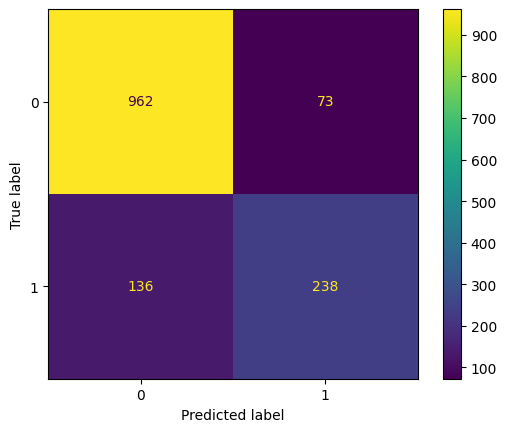

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,y_pred,labels=lgb.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=lgb.classes_)
disp.plot()
plt.show()

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred)
roc_data = pd.DataFrame({'FPR': fpr, 'TPR': tpr})
fig = px.line(roc_data, x='FPR', y='TPR',
              title=f'Curva ROC (AUC = {auc:.2f})',
              labels={'FPR': 'False Positive Rate', 'TPR': 'True Positive Rate'},
              line_shape='linear')
fig.add_scatter(x=[0, 1], y=[0, 1], mode='lines',
                 line=dict(color='grey', dash='dash'),
                 name='Random Line')


fig.data[0].line.color = 'rgba(141, 8, 1, 0.7)'
fig.update_layout(yaxis=dict(range=[0, 1]), xaxis=dict(range=[0, 1]),
                  width=1000,
                  height=600,
                  showlegend=True)

fig.show()

In [ ]:
xgb=XGBClassifier(colsample_bytree= 0.8, gamma= 0.5, learning_rate=0.1, max_depth= 3, n_estimators= 100,subsample= 0.6)   #'colsample_bytree': 0.8, 'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.6
xgb.fit(x_train_std,y_train)
y_pred=xgb.predict(x_test_std)
y_pred_train=xgb.predict(x_train_std)

print("test_f1:",f1_score(y_test,y_pred))
print("train_f1:",f1_score(y_train,y_pred_train))
print("test_auc:",roc_auc_score(y_test,y_pred))
print("train_auc:" ,roc_auc_score(y_train,y_pred_train))
print(classification_report(y_test,y_pred))
print(classification_report(y_train,y_pred_train))
print("test_recall:",recall_score(y_test,y_pred))
print("train_recall:",recall_score(y_train,y_pred_train))
print("test_accuracy:",accuracy_score(y_test,y_pred))
print("train_accuracy:",accuracy_score(y_train,y_pred_train))



test_f1: 0.6944858420268256
train_f1: 0.7329805996472664
test_auc: 0.7805794518070733
train_auc: 0.8111301988346432
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      1035
           1       0.78      0.62      0.69       374

    accuracy                           0.85      1409
   macro avg       0.83      0.78      0.80      1409
weighted avg       0.85      0.85      0.85      1409

              precision    recall  f1-score   support

           0       0.89      0.93      0.91      4139
           1       0.78      0.69      0.73      1495

    accuracy                           0.87      5634
   macro avg       0.83      0.81      0.82      5634
weighted avg       0.86      0.87      0.86      5634

test_recall: 0.6229946524064172
train_recall: 0.6949832775919732
test_accuracy: 0.8545067423704755
train_accuracy: 0.8656372026979056


In [ ]:
rf=RandomForestClassifier(max_depth=30, min_samples_leaf=2, min_samples_split=10,n_estimators=200)
rf.fit(x_train_std,y_train)
y_pred=rf.predict(x_test_std)
y_pred_train=rf.predict(x_train_std)

print("test_f1:",f1_score(y_test,y_pred))
print("train_f1:",f1_score(y_train,y_pred_train))
print("test_auc:",roc_auc_score(y_test,y_pred))
print("train_auc:" ,roc_auc_score(y_train,y_pred_train))
print(classification_report(y_test,y_pred))
print(classification_report(y_train,y_pred_train))
print("test_recall:",recall_score(y_test,y_pred))
print("train_recall:",recall_score(y_train,y_pred_train))
print("test_accuracy:",accuracy_score(y_test,y_pred))
print("train_accuracy:",accuracy_score(y_train,y_pred_train))


test_f1: 0.6757575757575758
train_f1: 0.8809438684304612
test_auc: 0.7676935596372936
train_auc: 0.903583984951045
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      1035
           1       0.78      0.60      0.68       374

    accuracy                           0.85      1409
   macro avg       0.82      0.77      0.79      1409
weighted avg       0.84      0.85      0.84      1409

              precision    recall  f1-score   support

           0       0.94      0.98      0.96      4139
           1       0.95      0.82      0.88      1495

    accuracy                           0.94      5634
   macro avg       0.94      0.90      0.92      5634
weighted avg       0.94      0.94      0.94      5634

test_recall: 0.5962566844919787
train_recall: 0.8240802675585285
test_accuracy: 0.8481192334989354
train_accuracy: 0.9408945686900958


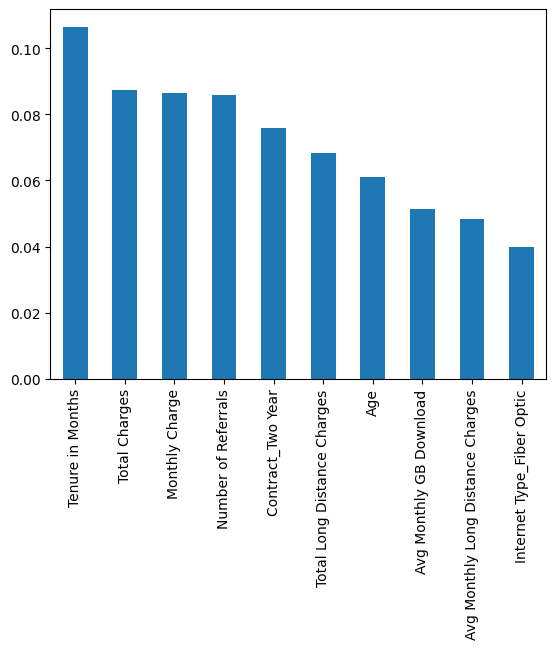

In [ ]:
feature_importances = pd.Series(rf.feature_importances_, index=x_train.columns).sort_values(ascending=False).head(10)

# Plot a simple bar chart
feature_importances.plot.bar();

In [ ]:
## Grid Search CV
#...........



#...........

In [ ]:
# Hyper Parameter Tuning for Support Vector Machine
from sklearn.model_selection import GridSearchCV

# defining parameter range
param_grid = {'C': [0.1, 1, 5],
			'gamma': [1, 0.1, 0.01],
			'kernel': ['rbf','sigmoid','poly']}

grid = GridSearchCV(SVC(), param_grid,scoring="f1",refit = True, verbose = 3)

# fitting the model for grid search
grid.fit(x_train_std,y_train)
print(grid.best_estimator_)
print(grid.best_score_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.000 total time=   1.4s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.000 total time=   1.4s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.000 total time=   1.4s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.000 total time=   1.4s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.000 total time=   1.4s
[CV 1/5] END ....C=0.1, gamma=1, kernel=sigmoid;, score=0.460 total time=   0.6s
[CV 2/5] END ....C=0.1, gamma=1, kernel=sigmoid;, score=0.445 total time=   0.7s
[CV 3/5] END ....C=0.1, gamma=1, kernel=sigmoid;, score=0.442 total time=   0.8s
[CV 4/5] END ....C=0.1, gamma=1, kernel=sigmoid;, score=0.411 total time=   1.1s
[CV 5/5] END ....C=0.1, gamma=1, kernel=sigmoid;, score=0.428 total time=   1.0s
[CV 1/5] END .......C=0.1, gamma=1, kernel=poly;, score=0.521 total time=   2.4s
[CV 2/5] END .......C=0.1, gamma=1, kernel=poly

In [ ]:
y_pred=grid.predict(x_test_std)
y_pred_train=grid.predict(x_train_std)

print("test_f1:",f1_score(y_test,y_pred))
print("train_f1:",f1_score(y_train,y_pred_train))

test_f1: 0.6763425253991292
train_f1: 0.7434996486296557


In [ ]:
# Hyper Parameter Tuning for RandomForest Classifier
from sklearn.ensemble import RandomForestClassifier

# defining parameter range
param_grid = {
    'n_estimators': [100, 200],  # Number of trees in the forest
    'max_features': ['sqrt', 'log2'],  # Number of features to consider at each split
    'max_depth': [10, 20, 30],   # Maximum depth of the tree
    'min_samples_split': [5, 10],   # Minimum number of samples required to split an internal node
    'min_samples_leaf': [2, 4],     # Minimum number of samples required to be at a leaf node
}

# Creating the GridSearchCV object
grid = GridSearchCV(
    estimator=RandomForestClassifier(),
    param_grid=param_grid,scoring="f1",
    cv=5,  # 5-fold cross-validation
    n_jobs=-1,  # Use all available cores
    verbose=3,
    refit=True
)

# Fitting the grid search to the data
grid.fit(x_train_std, y_train)
print(grid.best_estimator_)
print(grid.best_score_)



Fitting 5 folds for each of 48 candidates, totalling 240 fits
RandomForestClassifier(max_depth=30, min_samples_leaf=4, min_samples_split=10)
0.6667650958943573


In [ ]:

y_pred=grid.predict(x_test_std)
y_pred_train=grid.predict(x_train_std)

print("test_f1:",f1_score(y_test,y_pred))
print("train_f1:",f1_score(y_train,y_pred_train))

test_f1: 0.6827794561933535
train_f1: 0.8441558441558441


In [ ]:
## Hyper Parameter Tuning for XGBClassifier
# defining parameter range
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3,5,],
    'subsample': [0.6, 0.8],
    'colsample_bytree': [0.6, 0.8],
    'gamma': [0.1,0.5],
}

# Create a GridSearchCV object with XGBClassifier
grid = GridSearchCV(XGBClassifier(use_label_encoder=False, eval_metric='mlogloss'),
                    param_grid,
                    scoring="f1",
                    refit=True,
                    verbose=3,
                    n_jobs=-1,
                    cv=5)

# Fit the grid with training data
grid.fit(x_train_std, y_train)

# Print the best parameters and best score
print(f"Best parameters found: {grid.best_params_}")
print(f"Best cross-validation score: {grid.best_score_}")


Fitting 5 folds for each of 96 candidates, totalling 480 fits
Best parameters found: {'colsample_bytree': 0.6, 'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}
Best cross-validation score: 0.7070989887074743


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning:

[13:09:20] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




In [ ]:
y_pred=grid.predict(x_test_std)
y_pred_train=grid.predict(x_train_std)

print("test_f1:",f1_score(y_test,y_pred))
print("train_f1:",f1_score(y_train,y_pred_train))

test_f1: 0.6989720998531571
train_f1: 0.7355920363255326


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# defining parameter range
param_grid = {
    'C': [0.1, 1, 10, 100],  # Regularization strength
    'penalty': ['l2'],  # Regularization type
    'solver': ['lbfgs', 'saga']  # Solvers that support l2 and none penalties
}

# Creating the GridSearchCV object
grid = GridSearchCV(LogisticRegression(max_iter=1000), param_grid, refit=True, verbose=3,scoring="f1")

# Fitting the model
grid.fit(x_train_std, y_train)
print(f"Best parameters found: {grid.best_params_}")
print(f"Best cross-validation score: {grid.best_score_}")


Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV 1/5] END ...C=0.1, penalty=l2, solver=lbfgs;, score=0.728 total time=   0.0s
[CV 2/5] END ...C=0.1, penalty=l2, solver=lbfgs;, score=0.680 total time=   0.0s
[CV 3/5] END ...C=0.1, penalty=l2, solver=lbfgs;, score=0.683 total time=   0.0s
[CV 4/5] END ...C=0.1, penalty=l2, solver=lbfgs;, score=0.642 total time=   0.0s
[CV 5/5] END ...C=0.1, penalty=l2, solver=lbfgs;, score=0.663 total time=   0.0s
[CV 1/5] END ....C=0.1, penalty=l2, solver=saga;, score=0.728 total time=   0.1s
[CV 2/5] END ....C=0.1, penalty=l2, solver=saga;, score=0.680 total time=   0.1s
[CV 3/5] END ....C=0.1, penalty=l2, solver=saga;, score=0.683 total time=   0.1s
[CV 4/5] END ....C=0.1, penalty=l2, solver=saga;, score=0.644 total time=   0.1s
[CV 5/5] END ....C=0.1, penalty=l2, solver=saga;, score=0.663 total time=   0.1s
[CV 1/5] END .....C=1, penalty=l2, solver=lbfgs;, score=0.734 total time=   0.0s
[CV 2/5] END .....C=1, penalty=l2, solver=lbfgs;,

In [ ]:
y_pred=grid.predict(x_test_std)
y_pred_train=grid.predict(x_train_std)

print("test_f1:",f1_score(y_test,y_pred))
print("train_f1:",f1_score(y_train,y_pred_train))

test_f1: 0.6744525547445256
train_f1: 0.693891557995882


In [ ]:
### hyperparameter tuning for kNN
from sklearn.model_selection import GridSearchCV
estimator_KNN = KNeighborsClassifier(algorithm='auto')
parameters_KNN = {
    'n_neighbors': (3,11, 2),
    'leaf_size': (20,40,4),
    'p': (1,2),
    'weights': ('uniform', 'distance'),
    'metric': ('minkowski', 'chebyshev')}

# with GridSearch
grid_search_KNN = GridSearchCV(
    estimator=estimator_KNN,
    param_grid=parameters_KNN,
    scoring = 'f1',
    n_jobs = -1,
    cv = 10)
KNN=grid_search_KNN.fit(x_train_std, y_train)
y_pred_KNN=KNN.predict(x_test_std)
y_pred_train_KNN=KNN.predict(x_train_std)
print("test_f1:",f1_score(y_test,y_pred_KNN))
print("train_f1:",f1_score(y_train,y_pred_train_KNN))
print(grid_search_KNN.best_params_ )
print('Best Score - KNN:', grid_search_KNN.best_score_ )

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning:

invalid value encountered in cast



test_f1: 0.6551264980026631
train_f1: 0.695016611295681
{'leaf_size': 20, 'metric': 'minkowski', 'n_neighbors': 11, 'p': 2, 'weights': 'uniform'}
Best Score - KNN: 0.6390286153178475


In [ ]:
y_pred=grid.predict(x_test_std)
y_pred_train=grid.predict(x_train_std)

print("test_f1:",f1_score(y_test,y_pred))
print("train_f1:",f1_score(y_train,y_pred_train))

test_f1: 0.6744525547445256
train_f1: 0.693891557995882


In [ ]:
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb

# Defining parameter range
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [50, 100],
    'max_depth': [3, 7, -1],  # -1 means no limit
    'num_leaves': [20, 40],
    'min_child_samples': [10, 30],
    'colsample_bytree': [ 0.8, 1.0],
    'subsample': [ 0.8, 1.0]
}

# Create the LGBMClassifier
lgbm = lgb.LGBMClassifier()

# Initialize GridSearchCV
grid = GridSearchCV(estimator=lgbm, param_grid=param_grid,
                    scoring='f1', cv=5, verbose=3, n_jobs=-1)

# Fit the model
grid.fit(x_train_std, y_train)
print(grid.best_params_ )
print('Best Score :', grid.best_score_ )

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning:

invalid value encountered in cast



[LightGBM] [Info] Number of positive: 1495, number of negative: 4139
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002045 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1468
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265353 -> initscore=-1.018328
[LightGBM] [Info] Start training from score -1.018328
{'colsample_bytree': 1.0, 'learning_rate': 0.05, 'max_depth': -1, 'min_child_samples': 30, 'n_estimators': 100, 'num_leaves': 20, 'subsample': 0.8}
Best Score : 0.7017819912471971


In [ ]:
y_pred=grid.predict(x_test_std)
y_pred_train=grid.predict(x_train_std)

print("test_f1:",f1_score(y_test,y_pred))
print("train_f1:",f1_score(y_train,y_pred_train))

test_f1: 0.7048458149779736
train_f1: 0.773876404494382
